## Runs DE on different clusters. 
Does this over each donor and combined

In [1]:
se_f = "/data/Mito_Trace/output/aggregate/CHIP_aggr/v04_no_ChA1/data/annotation/gff_A2/mergedSamples/allSamples.integrated.group.rds"
outdir = "/data/Mito_Trace/output/aggregate/CHIP_aggr/v04_no_ChA1/data/annotation/gff_A2/mergedSamples/de_acrossclust_RNA/minPct_0.1_logfc0.1"
sample_names = "CHIP_b1_Flt3l,CHIP_b1_Input,CHIP_b2_Input,cd34norm_Flt3l"


minPct = 0.1 
logfcthresh = 0.1 
p_thresh = 0.1
to_donors = FALSE

# Parameters
assay="RNA"

# Parallel processing
cores = 16

# R utils script
utils_script <- "/data/Mito_Trace/R_scripts/seurat_utils.R"

#to_donors = TRUE


In [2]:
source(utils_script)
outdir = outdir
dir.create(outdir, showWarnings = FALSE)


Registered S3 method overwritten by 'spatstat.core':
  method          from
  formula.glmmPQL MASS

Attaching SeuratObject

Attaching sp

Warning message:
“package ‘dplyr’ was built under R version 4.1.3”

Attaching package: ‘dplyr’


The following objects are masked from ‘package:stats’:

    filter, lag


The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union


Loading required package: ggplot2

Warning message:
“package ‘ggplot2’ was built under R version 4.1.3”
Loading required package: patchwork



In [3]:
sample_names <- unlist(strsplit(sample_names, ",")[[1]])
sample_names

[1] "CHIP_b1_Flt3l"  "CHIP_b1_Input"  "CHIP_b2_Input"  "cd34norm_Flt3l"

In [4]:
library(GenomicRanges)
library(Seurat)
library(Signac)
library(GenomeInfoDb)
library(EnsDb.Hsapiens.v75)
library(ggplot2)
library(patchwork)
set.seed(1234)
library(data.table)
library(magrittr)
library(cowplot)
library(metap)
library("RColorBrewer")

library(future)
plan()

plan("multiprocess", workers = cores)
#options(future.globals.maxSize = 50000 * 1024^2) # for 50 Gb RAM
options(future.globals.maxSize = 8000 * 1024^2)

Loading required package: stats4

Loading required package: BiocGenerics


Attaching package: ‘BiocGenerics’


The following objects are masked from ‘package:dplyr’:

    combine, intersect, setdiff, union


The following objects are masked from ‘package:stats’:

    IQR, mad, sd, var, xtabs


The following objects are masked from ‘package:base’:

    anyDuplicated, append, as.data.frame, basename, cbind, colnames,
    dirname, do.call, duplicated, eval, evalq, Filter, Find, get, grep,
    grepl, intersect, is.unsorted, lapply, Map, mapply, match, mget,
    order, paste, pmax, pmax.int, pmin, pmin.int, Position, rank,
    rbind, Reduce, rownames, sapply, setdiff, sort, table, tapply,
    union, unique, unsplit, which.max, which.min


Loading required package: S4Vectors

Warning message:
“package ‘S4Vectors’ was built under R version 4.1.2”

Attaching package: ‘S4Vectors’


The following objects are masked from ‘package:dplyr’:

    first, rename


The following objects are masked from 

sequential:
- args: function (..., envir = parent.frame())
- tweaked: FALSE
- call: NULL

Warning message:
"Strategy 'multiprocess' is deprecated in future (>= 1.20.0). Instead, explicitly specify either 'multisession' or 'multicore'. In the current R session, 'multiprocess' equals 'multicore'."


In [5]:
se <- readRDS(se_f)#file.path(indir, paste0("allSamples.integrated.rds")))
se

An object of class Seurat 
222734 features across 30062 samples within 2 assays 
Active assay: RNA (19039 features, 0 variable features)
 1 other assay present: ATAC
 2 dimensional reductions calculated: integrated_lsi, umap

In [6]:
Idents(se) <- se$cluster_labels

## Run DE for  cluster vs all others 

In [7]:
#btwnClust.outdir <- file.path(outdir, "acrossClust")
#dir.create(btwnClust.outdir)
#outdir <- btwnClust.outdir



### Loop through pairs of clusters

In [8]:
cl_pairs <- combn(as.character(unique(se$cluster_labels)),2, simplify=F)
cl_pairs

[[1]]
[1] "Neutrophil 2" "HSPC 2"      

[[2]]
[1] "Neutrophil 2" "MkP 1"       

[[3]]
[1] "Neutrophil 2" "Erythrocyte" 

[[4]]
[1] "Neutrophil 2" "Granulocytes"

[[5]]
[1] "Neutrophil 2" "Unknown 1"   

[[6]]
[1] "Neutrophil 2" "preB-cell"   

[[7]]
[1] "Neutrophil 2" "Neutrophil 1"

[[8]]
[1] "Neutrophil 2"           "Non-classical monocyte"

[[9]]
[1] "Neutrophil 2" "HSPC 3"      

[[10]]
[1] "Neutrophil 2" "Progenitor 1"

[[11]]
[1] "Neutrophil 2" "Lymphoid 1"  

[[12]]
[1] "Neutrophil 2" "Monocyte 1"  

[[13]]
[1] "Neutrophil 2" "HSPC 1"      

[[14]]
[1] "Neutrophil 2" "preDC"       

[[15]]
[1] "Neutrophil 2" "HSPC 4"      

[[16]]
[1] "Neutrophil 2" "MkP 2"       

[[17]]
[1] "HSPC 2" "MkP 1" 

[[18]]
[1] "HSPC 2"      "Erythrocyte"

[[19]]
[1] "HSPC 2"       "Granulocytes"

[[20]]
[1] "HSPC 2"    "Unknown 1"

[[21]]
[1] "HSPC 2"    "preB-cell"

[[22]]
[1] "HSPC 2"       "Neutrophil 1"

[[23]]
[1] "HSPC 2"                 "Non-classical monocyte"

[[24]]
[1] "HSPC 2" "HSPC 3"

[[25]]
[1] "HSPC 2"       "Progenitor 1"

[[26]]
[1] "HSPC 2"     "Lymphoid 1"

[[27]]
[1] "HSPC 2"     "Monocyte 1"

[[28]]
[1] "HSPC 2" "HSPC 1"

[[29]]
[1] "HSPC 2" "preDC" 

[[30]]
[1] "HSPC 2" "HSPC 4"

[[31]]
[1] "HSPC 2" "MkP 2" 

[[32]]
[1] "MkP 1"       "Erythrocyte"

[[33]]
[1] "MkP 1"        "Granulocytes"

[[34]]
[1] "MkP 1"     "Unknown 1"

[[35]]
[1] "MkP 1"     "preB-cell"

[[36]]
[1] "MkP 1"        "Neutrophil 1"

[[37]]
[1] "MkP 1"                  "Non-classical monocyte"

[[38]]
[1] "MkP 1"  "HSPC 3"

[[39]]
[1] "MkP 1"        "Progenitor 1"

[[40]]
[1] "MkP 1"      "Lymphoid 1"

[[41]]
[1] "MkP 1"      "Monocyte 1"

[[42]]
[1] "MkP 1"  "HSPC 1"

[[43]]
[1] "MkP 1" "preDC"

[[44]]
[1] "MkP 1"  "HSPC 4"

[[45]]
[1] "MkP 1" "MkP 2"

[[46]]
[1] "Erythrocyte"  "Granulocytes"

[[47]]
[1] "Erythrocyte" "Unknown 1"  

[[48]]
[1] "Erythrocyte" "preB-cell"  

[[49]]
[1] "Erythrocyte"  "Neutrophil 1"

[[50]]
[1] "Erythrocyte"            "Non-classical monocyte"

[[51]]
[1] "Erythrocyte" "HSPC 3"     

[[52]]
[1] "Erythrocyte"  "Progenitor 1"

[[53]]
[1] "Erythrocyte" "Lymphoid 1" 

[[54]]
[1] "Erythrocyte" "Monocyte 1" 

[[55]]
[1] "Erythrocyte" "HSPC 1"     

[[56]]
[1] "Erythrocyte" "preDC"      

[[57]]
[1] "Erythrocyte" "HSPC 4"     

[[58]]
[1] "Erythrocyte" "MkP 2"      

[[59]]
[1] "Granulocytes" "Unknown 1"   

[[60]]
[1] "Granulocytes" "preB-cell"   

[[61]]
[1] "Granulocytes" "Neutrophil 1"

[[62]]
[1] "Granulocytes"           "Non-classical monocyte"

[[63]]
[1] "Granulocytes" "HSPC 3"      

[[64]]
[1] "Granulocytes" "Progenitor 1"

[[65]]
[1] "Granulocytes" "Lymphoid 1"  

[[66]]
[1] "Granulocytes" "Monocyte 1"  

[[67]]
[1] "Granulocytes" "HSPC 1"      

[[68]]
[1] "Granulocytes" "preDC"       

[[69]]
[1] "Granulocytes" "HSPC 4"      

[[70]]
[1] "Granulocytes" "MkP 2"       

[[71]]
[1] "Unknown 1" "preB-cell"

[[72]]
[1] "Unknown 1"    "Neutrophil 1"

[[73]]
[1] "Unknown 1"              "Non-classical monocyte"

[[74]]
[1] "Unknown 1" "HSPC 3"   

[[75]]
[1] "Unknown 1"    "Progenitor 1"

[[76]]
[1] "Unknown 1"  "Lymphoid 1"

[[77]]
[1] "Unknown 1"  "Monocyte 1"

[[78]]
[1] "Unknown 1" "HSPC 1"   

[[79]]
[1] "Unknown 1" "preDC"    

[[80]]
[1] "Unknown 1" "HSPC 4"   

[[81]]
[1] "Unknown 1" "MkP 2"    

[[82]]
[1] "preB-cell"    "Neutrophil 1"

[[83]]
[1] "preB-cell"              "Non-classical monocyte"

[[84]]
[1] "preB-cell" "HSPC 3"   

[[85]]
[1] "preB-cell"    "Progenitor 1"

[[86]]
[1] "preB-cell"  "Lymphoid 1"

[[87]]
[1] "preB-cell"  "Monocyte 1"

[[88]]
[1] "preB-cell" "HSPC 1"   

[[89]]
[1] "preB-cell" "preDC"    

[[90]]
[1] "preB-cell" "HSPC 4"   

[[91]]
[1] "preB-cell" "MkP 2"    

[[92]]
[1] "Neutrophil 1"           "Non-classical monocyte"

[[93]]
[1] "Neutrophil 1" "HSPC 3"      

[[94]]
[1] "Neutrophil 1" "Progenitor 1"

[[95]]
[1] "Neutrophil 1" "Lymphoid 1"  

[[96]]
[1] "Neutrophil 1" "Monocyte 1"  

[[97]]
[1] "Neutrophil 1" "HSPC 1"      

[[98]]
[1] "Neutrophil 1" "preDC"       

[[99]]
[1] "N

In [9]:
length(cl_pairs)

[1] 136

In [13]:
pair_de <- function(p){
    print("p")
    print(p)
    id1 = p[1]
    id2 = p[2]
    
    name <- stringr::str_replace_all(paste0("clusters_", id1, "_", id2), " ", "_")
    
    try({
        print(paste("cluster", id1))
        response <- FindMarkers(
                      object = se,
                      ident.1 = id1, ident.2=id2, #"CD4 Naive",
                      min.pct = minPct, logfc.threshold=logfcthresh,
                      test.use = 'wilcox', latent.vars = NULL
                    )
        print(head(response))

        print(paste('saved cluster', id1))
        response <- response %>% dplyr::arrange(p_val)
        response$p_val_adj_BH <- stats::p.adjust(response$p_val, method = "BH", n = length(response$p_val))    
        write.csv(response,
                  file=file.path(outdir, paste0(name,".DE.csv")), quote=F)
        curr.sig <- response %>% dplyr::filter(p_val_adj_BH<p_thresh)
        names.sig <- rownames(curr.sig)

        # Add to all pvals
        de.plots(se, names.sig, outdir, curr.name=name, max.size=10, to.heat=T,to.vln=T)

    })   
}


[1] "p"
[1] "Neutrophil 2" "HSPC 2"      
[1] "cluster Neutrophil 2"
                p_val avg_log2FC pct.1 pct.2     p_val_adj
PRTN3   8.232422e-109  0.2174264 0.233 0.025 1.567371e-104
FNDC3B  3.814213e-106  0.5153976 0.955 0.787 7.261880e-102
ELANE   3.479880e-100  0.2232356 0.232 0.030  6.625343e-96
LPO      1.740768e-81  0.3775558 0.559 0.248  3.314249e-77
FAM107B  4.850075e-74  0.4452836 0.831 0.572  9.234059e-70
COL23A1  2.096207e-73  0.4579114 0.800 0.546  3.990969e-69
[1] "saved cluster Neutrophil 2"


Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image



[1] "p"
[1] "Neutrophil 2" "MkP 1"       
[1] "cluster Neutrophil 2"
                p_val avg_log2FC pct.1 pct.2     p_val_adj
FNDC3B  1.298273e-237  0.9640862 0.955 0.685 2.471783e-233
ABCC4   4.698181e-180 -0.9401708 0.538 0.832 8.944867e-176
MPO     1.823078e-176  0.5563762 0.488 0.069 3.470957e-172
FAM107B 6.277530e-145  0.7288988 0.831 0.472 1.195179e-140
ATP8B4  1.037041e-143  0.7585219 0.888 0.592 1.974422e-139
LPO      5.280890e-99  0.4898493 0.559 0.220  1.005429e-94
[1] "saved cluster Neutrophil 2"


Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image



[1] "p"
[1] "Neutrophil 2" "Erythrocyte" 
[1] "cluster Neutrophil 2"
                p_val avg_log2FC pct.1 pct.2     p_val_adj
FNDC3B  5.924436e-214  0.9884487 0.955 0.612 1.127953e-209
ATP8B4  5.409623e-196  1.0042096 0.888 0.416 1.029938e-191
FAM107B 2.373725e-181  0.8867331 0.831 0.326 4.519335e-177
MPO     8.339154e-156  0.5663490 0.488 0.052 1.587692e-151
GAS7    4.255495e-126  0.6305225 0.769 0.306 8.102038e-122
MGAM    2.934146e-115  0.5422997 0.619 0.191 5.586320e-111
[1] "saved cluster Neutrophil 2"


Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image



[1] "p"
[1] "Neutrophil 2" "Granulocytes"
[1] "cluster Neutrophil 2"
                p_val avg_log2FC pct.1 pct.2     p_val_adj
MPO     5.032477e-179  0.5361359 0.488 0.076 9.581334e-175
COL23A1 6.118491e-122  0.6448394 0.800 0.466 1.164899e-117
ELANE    2.151266e-85  0.2271240 0.232 0.027  4.095796e-81
LPO      4.165943e-80  0.4014808 0.559 0.242  7.931539e-76
PRTN3    5.735968e-75  0.2032353 0.233 0.034  1.092071e-70
IL1RL1   2.268656e-74 -0.5048395 0.122 0.395  4.319295e-70
[1] "saved cluster Neutrophil 2"


Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image



[1] "p"
[1] "Neutrophil 2" "Unknown 1"   
[1] "cluster Neutrophil 2"
                  p_val avg_log2FC pct.1 pct.2    p_val_adj
FPR3       1.286828e-71 -0.6034366 0.109 0.500 2.449991e-67
CCL2       1.621608e-53 -0.2997096 0.021 0.255 3.087379e-49
FNDC3B     4.629983e-52  0.6229207 0.955 0.825 8.815025e-48
MOB3B      5.138773e-52 -0.7127296 0.400 0.716 9.783710e-48
AC067752.1 8.902556e-49 -0.7273527 0.332 0.649 1.694958e-44
ZNF365     2.408054e-48 -0.7633364 0.510 0.750 4.584694e-44
[1] "saved cluster Neutrophil 2"


The automatically generated colors map from the 1^st and 99^th of the
values in the matrix. There are outliers in the matrix whose patterns
might be hidden by this color mapping. You can manually set the color
to `col` argument.

Use `suppressMessages()` to turn off this message.

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image



[1] "p"
[1] "Neutrophil 2" "preB-cell"   
[1] "cluster Neutrophil 2"
                 p_val avg_log2FC pct.1 pct.2     p_val_adj
FNDC3B    0.000000e+00  1.4327219 0.955 0.480  0.000000e+00
ATP8B4   1.566829e-289  1.3486670 0.888 0.289 2.983087e-285
IQSEC1   3.093527e-165 -1.1244382 0.746 0.892 5.889766e-161
RAB31    7.046930e-146  0.7025438 0.663 0.211 1.341665e-141
SLC39A11 2.153910e-138  0.7233453 0.759 0.336 4.100830e-134
FRY      5.352731e-136  0.7169585 0.872 0.516 1.019106e-131
[1] "saved cluster Neutrophil 2"


The automatically generated colors map from the 1^st and 99^th of the
values in the matrix. There are outliers in the matrix whose patterns
might be hidden by this color mapping. You can manually set the color
to `col` argument.

Use `suppressMessages()` to turn off this message.

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image



[1] "p"
[1] "Neutrophil 2" "Neutrophil 1"
[1] "cluster Neutrophil 2"
                p_val avg_log2FC pct.1 pct.2    p_val_adj
NBAS     3.823353e-23 -0.2918902 0.522 0.614 7.279281e-19
CACNA2D2 1.392017e-21  0.1710137 0.386 0.234 2.650262e-17
CMIP     8.692061e-20  0.2168164 0.807 0.677 1.654881e-15
NOS1     1.208007e-19  0.1731965 0.449 0.297 2.299924e-15
GREB1L   4.345870e-19  0.1481234 0.465 0.311 8.274101e-15
R3HDM2   8.575096e-19  0.1771151 0.515 0.362 1.632613e-14
[1] "saved cluster Neutrophil 2"


The automatically generated colors map from the 1^st and 99^th of the
values in the matrix. There are outliers in the matrix whose patterns
might be hidden by this color mapping. You can manually set the color
to `col` argument.

Use `suppressMessages()` to turn off this message.

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image



[1] "p"
[1] "Neutrophil 2"           "Non-classical monocyte"
[1] "cluster Neutrophil 2"
               p_val avg_log2FC pct.1 pct.2     p_val_adj
FNDC3B 4.055887e-153  0.8094544 0.955 0.713 7.722004e-149
MPO    1.323210e-106  0.5073709 0.488 0.102 2.519260e-102
ATP10A 5.364905e-106 -0.8174463 0.335 0.671 1.021424e-101
ZBTB16  7.283487e-79  0.5507767 0.729 0.394  1.386703e-74
RB1     1.443507e-77 -0.6461184 0.661 0.801  2.748293e-73
MOB3B   1.909950e-65 -0.6370881 0.400 0.628  3.636355e-61
[1] "saved cluster Neutrophil 2"


Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image



[1] "p"
[1] "Neutrophil 2" "HSPC 3"      
[1] "cluster Neutrophil 2"
               p_val avg_log2FC pct.1 pct.2     p_val_adj
LYST   7.176235e-117  0.4215233 0.683 0.163 1.366283e-112
PCNX1  1.764158e-111  0.3599805 0.663 0.154 3.358781e-107
TRERF1 2.214980e-108  0.3143206 0.680 0.167 4.217101e-104
PIWIL4  2.493064e-97  0.2305547 0.629 0.154  4.746544e-93
LPO     5.417199e-96  0.2710367 0.559 0.123  1.031380e-91
BAZ1A   3.223816e-95  0.2702352 0.578 0.133  6.137824e-91
[1] "saved cluster Neutrophil 2"


The automatically generated colors map from the 1^st and 99^th of the
values in the matrix. There are outliers in the matrix whose patterns
might be hidden by this color mapping. You can manually set the color
to `col` argument.

Use `suppressMessages()` to turn off this message.

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image



[1] "p"
[1] "Neutrophil 2" "Progenitor 1"
[1] "cluster Neutrophil 2"
                 p_val avg_log2FC pct.1 pct.2     p_val_adj
FNDC3B   1.989638e-117  1.0945482 0.955 0.498 3.788072e-113
ATP8B4    3.219242e-77  0.8231721 0.888 0.449  6.129115e-73
MBNL1     6.574147e-65  0.7220018 0.880 0.441  1.251652e-60
FAM107B   1.444197e-57  0.6534835 0.831 0.404  2.749607e-53
FRY       3.910848e-57  0.6063885 0.872 0.484  7.445864e-53
RALGAPA2  4.977528e-53  0.5573594 0.790 0.381  9.476716e-49
[1] "saved cluster Neutrophil 2"


Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image



[1] "p"
[1] "Neutrophil 2" "Lymphoid 1"  
[1] "cluster Neutrophil 2"
                p_val avg_log2FC pct.1 pct.2     p_val_adj
FNDC3B  1.256429e-106  1.1572481 0.955 0.580 2.392116e-102
MPO      7.759752e-46  0.5503502 0.488 0.075  1.477379e-41
COL23A1  4.092671e-45  0.6476996 0.800 0.441  7.792036e-41
ATP8B4   5.629155e-42  0.6292076 0.888 0.556  1.071735e-37
LPO      7.819385e-37  0.5107321 0.559 0.184  1.488733e-32
FAM107B  1.170574e-35  0.5311211 0.831 0.487  2.228655e-31
[1] "saved cluster Neutrophil 2"


The automatically generated colors map from the 1^st and 99^th of the
values in the matrix. There are outliers in the matrix whose patterns
might be hidden by this color mapping. You can manually set the color
to `col` argument.

Use `suppressMessages()` to turn off this message.

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image



[1] "p"
[1] "Neutrophil 2" "Monocyte 1"  
[1] "cluster Neutrophil 2"
                p_val avg_log2FC pct.1 pct.2    p_val_adj
FNDC3B   2.454492e-94  0.4733308 0.955 0.794 4.673107e-90
MPO      2.476634e-67  0.3007012 0.488 0.221 4.715264e-63
RALGAPA2 1.253223e-62  0.3788426 0.790 0.542 2.386011e-58
ZBTB16   1.034783e-59  0.3709048 0.729 0.466 1.970123e-55
PDZD8    2.442305e-55  0.3059131 0.538 0.290 4.649904e-51
LPO      1.385359e-51  0.2921321 0.559 0.310 2.637586e-47
[1] "saved cluster Neutrophil 2"


The automatically generated colors map from the 1^st and 99^th of the
values in the matrix. There are outliers in the matrix whose patterns
might be hidden by this color mapping. You can manually set the color
to `col` argument.

Use `suppressMessages()` to turn off this message.

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image



[1] "p"
[1] "Neutrophil 2" "HSPC 1"      
[1] "cluster Neutrophil 2"
                p_val avg_log2FC pct.1 pct.2     p_val_adj
FNDC3B   0.000000e+00  1.0170257 0.955 0.659  0.000000e+00
MPO      0.000000e+00  0.5501395 0.488 0.073  0.000000e+00
ATP8B4  2.263509e-235  0.8459910 0.888 0.555 4.309494e-231
COL23A1 1.175605e-215  0.7635887 0.800 0.432 2.238235e-211
FAM107B 4.809455e-215  0.7472212 0.831 0.459 9.156721e-211
MICU1   1.733089e-214  0.6136779 0.658 0.248 3.299628e-210
[1] "saved cluster Neutrophil 2"


The automatically generated colors map from the 1^st and 99^th of the
values in the matrix. There are outliers in the matrix whose patterns
might be hidden by this color mapping. You can manually set the color
to `col` argument.

Use `suppressMessages()` to turn off this message.

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image



[1] "p"
[1] "Neutrophil 2" "preDC"       
[1] "cluster Neutrophil 2"
                 p_val avg_log2FC pct.1 pct.2     p_val_adj
YPEL5    4.758563e-159 -0.4925484 0.181 0.687 9.059827e-155
VIM      3.910812e-155 -0.5001296 0.229 0.735 7.445794e-151
ATP8B4   2.066375e-147  0.7430282 0.888 0.792 3.934172e-143
SLC39A11 2.422980e-144  0.7350117 0.759 0.539 4.613111e-140
FNDC3B   8.701495e-122  0.5744029 0.955 0.918 1.656678e-117
DIPK2A   6.533841e-121 -0.4453507 0.309 0.767 1.243978e-116
[1] "saved cluster Neutrophil 2"


The automatically generated colors map from the 1^st and 99^th of the
values in the matrix. There are outliers in the matrix whose patterns
might be hidden by this color mapping. You can manually set the color
to `col` argument.

Use `suppressMessages()` to turn off this message.

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image



[1] "p"
[1] "Neutrophil 2" "HSPC 4"      
[1] "cluster Neutrophil 2"
              p_val avg_log2FC pct.1 pct.2    p_val_adj
WNT16  4.220213e-40 -0.1246071 0.038 0.361 8.034863e-36
CD81   2.264793e-37 -0.1580518 0.083 0.504 4.311940e-33
FNDC3B 8.935303e-37  0.9155272 0.955 0.908 1.701192e-32
PLXNA1 2.042182e-36 -0.1530567 0.078 0.487 3.888111e-32
FRMD1  2.739313e-34 -0.1377986 0.056 0.395 5.215378e-30
ADCK2  4.323533e-34 -0.1409517 0.096 0.529 8.231575e-30
[1] "saved cluster Neutrophil 2"


The automatically generated colors map from the 1^st and 99^th of the
values in the matrix. There are outliers in the matrix whose patterns
might be hidden by this color mapping. You can manually set the color
to `col` argument.

Use `suppressMessages()` to turn off this message.

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image



[1] "p"
[1] "Neutrophil 2" "MkP 2"       
[1] "cluster Neutrophil 2"
                p_val avg_log2FC pct.1 pct.2     p_val_adj
FNDC3B  5.377902e-216  1.1471681 0.955 0.689 1.023899e-211
ATP8B4  2.036056e-179  1.1006208 0.888 0.496 3.876447e-175
FAM107B 8.872828e-146  0.9026154 0.831 0.445 1.689298e-141
COL23A1 5.056466e-123  0.8349275 0.800 0.461 9.627006e-119
MPO     8.973344e-122  0.5949446 0.488 0.039 1.708435e-117
GAS7    2.620779e-118  0.7135720 0.769 0.350 4.989701e-114
[1] "saved cluster Neutrophil 2"


Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image



[1] "p"
[1] "HSPC 2" "MkP 1" 
[1] "cluster HSPC 2"
                p_val avg_log2FC pct.1 pct.2     p_val_adj
ABCC4   5.587053e-207 -0.7698383 0.527 0.832 1.063719e-202
ZFPM1   3.553518e-169 -0.6177775 0.228 0.593 6.765543e-165
SOS1    1.195855e-105 -0.5305815 0.374 0.653 2.276788e-101
ST8SIA6  9.480952e-91 -0.4630846 0.374 0.632  1.805079e-86
ZBTB16   3.538705e-84 -0.4557557 0.601 0.806  6.737340e-80
ATP8B4   1.006809e-80  0.5214678 0.750 0.592  1.916863e-76
[1] "saved cluster HSPC 2"


The automatically generated colors map from the 1^st and 99^th of the
values in the matrix. There are outliers in the matrix whose patterns
might be hidden by this color mapping. You can manually set the color
to `col` argument.

Use `suppressMessages()` to turn off this message.

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image



[1] "p"
[1] "HSPC 2"      "Erythrocyte"
[1] "cluster HSPC 2"
               p_val avg_log2FC pct.1 pct.2     p_val_adj
ATP8B4 2.466521e-142  0.7671555 0.750 0.416 4.696009e-138
ZFPM1  2.321452e-127 -0.6609685 0.228 0.545 4.419812e-123
DNAJC6 3.575852e-102 -0.6257073 0.322 0.597  6.808064e-98
DOCK10  2.517689e-99  0.6096877 0.678 0.390  4.793427e-95
SORL1   3.594529e-87  0.5086713 0.573 0.287  6.843623e-83
GAS7    4.369752e-86  0.5268047 0.596 0.306  8.319571e-82
[1] "saved cluster HSPC 2"


Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image



[1] "p"
[1] "HSPC 2"       "Granulocytes"
[1] "cluster HSPC 2"
               p_val avg_log2FC pct.1 pct.2     p_val_adj
IL1RL1 6.498366e-165 -0.5083162 0.090 0.395 1.237224e-160
IL18R1 9.278853e-138 -0.5479007 0.176 0.474 1.766601e-133
HDC     1.590074e-89 -0.4001561 0.171 0.407  3.027342e-85
CLC     2.363453e-86 -0.2365838 0.013 0.154  4.499777e-82
UGT1A7  2.706632e-78 -0.3352255 0.129 0.342  5.153156e-74
GRAP2   1.148045e-77 -0.3855518 0.228 0.457  2.185763e-73
[1] "saved cluster HSPC 2"


Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image



[1] "p"
[1] "HSPC 2"    "Unknown 1"
[1] "cluster HSPC 2"
                p_val avg_log2FC pct.1 pct.2     p_val_adj
CCL2    2.198667e-116 -0.3062239 0.014 0.255 4.186042e-112
FPR3    5.604592e-107 -0.5712643 0.097 0.500 1.067058e-102
SLCO2B1  2.892667e-63 -0.5283895 0.208 0.579  5.507348e-59
ZNF577   4.328588e-63 -0.4246226 0.126 0.454  8.241198e-59
LILRB4   8.462106e-60 -0.2432480 0.042 0.257  1.611100e-55
FPR1     1.841400e-52 -0.4771782 0.182 0.510  3.505841e-48
[1] "saved cluster HSPC 2"


The automatically generated colors map from the 1^st and 99^th of the
values in the matrix. There are outliers in the matrix whose patterns
might be hidden by this color mapping. You can manually set the color
to `col` argument.

Use `suppressMessages()` to turn off this message.

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image



[1] "p"
[1] "HSPC 2"    "preB-cell"
[1] "cluster HSPC 2"
                p_val avg_log2FC pct.1 pct.2     p_val_adj
ATP8B4  4.949397e-247  1.1116129 0.750 0.289 9.423157e-243
IQSEC1  2.244632e-246 -1.1507271 0.639 0.892 4.273556e-242
CD81    7.412580e-191 -0.5405937 0.059 0.410 1.411281e-186
FNDC3B  2.454905e-188  0.9173242 0.787 0.480 4.673893e-184
FOXO6   1.515128e-185 -0.6520173 0.113 0.501 2.884652e-181
FAM163B 5.932819e-174 -0.3430873 0.017 0.293 1.129549e-169
[1] "saved cluster HSPC 2"


Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image



[1] "p"
[1] "HSPC 2"       "Neutrophil 1"
[1] "cluster HSPC 2"
                p_val avg_log2FC pct.1 pct.2     p_val_adj
PRTN3   3.078798e-132 -0.2901952 0.025 0.239 5.861723e-128
ELANE   8.158910e-119 -0.2637259 0.030 0.232 1.553375e-114
COL23A1 2.031225e-118 -0.5130051 0.546 0.772 3.867248e-114
LPO     3.310772e-112 -0.4490156 0.248 0.529 6.303379e-108
FNDC3B  6.604790e-111 -0.4401720 0.787 0.908 1.257486e-106
AZU1     7.749392e-94 -0.2281697 0.031 0.201  1.475407e-89
[1] "saved cluster HSPC 2"


Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image



[1] "p"
[1] "HSPC 2"                 "Non-classical monocyte"
[1] "cluster HSPC 2"
               p_val avg_log2FC pct.1 pct.2    p_val_adj
CDK6   8.099472e-101  0.6178804 0.834 0.648 1.542059e-96
ATP10A 3.444876e-100 -0.6282668 0.386 0.671 6.558700e-96
RB1     1.691151e-75 -0.5130514 0.606 0.801 3.219783e-71
KCNQ3   3.112816e-74 -0.4798306 0.339 0.606 5.926491e-70
CMKLR1  8.211117e-74 -0.4311545 0.202 0.459 1.563315e-69
P2RY6   9.009704e-72 -0.3622355 0.124 0.353 1.715358e-67
[1] "saved cluster HSPC 2"


The automatically generated colors map from the 1^st and 99^th of the
values in the matrix. There are outliers in the matrix whose patterns
might be hidden by this color mapping. You can manually set the color
to `col` argument.

Use `suppressMessages()` to turn off this message.

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image



[1] "p"
[1] "HSPC 2" "HSPC 3"
[1] "cluster HSPC 2"
                p_val avg_log2FC pct.1 pct.2    p_val_adj
MEIS1    2.234037e-82  0.2405693 0.542 0.169 4.253384e-78
BAALC    5.753791e-72  0.2039340 0.425 0.118 1.095464e-67
ARHGAP22 5.543908e-71  0.1880994 0.619 0.230 1.055505e-66
PTPN14   4.351981e-68  0.1590628 0.498 0.165 8.285736e-64
CARMIL1  2.855704e-67  0.1396112 0.535 0.183 5.436975e-63
NCALD    7.603104e-67  0.2227502 0.547 0.197 1.447555e-62
[1] "saved cluster HSPC 2"


The automatically generated colors map from the 1^st and 99^th of the
values in the matrix. There are outliers in the matrix whose patterns
might be hidden by this color mapping. You can manually set the color
to `col` argument.

Use `suppressMessages()` to turn off this message.

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image



[1] "p"
[1] "HSPC 2"       "Progenitor 1"
[1] "cluster HSPC 2"
              p_val avg_log2FC pct.1 pct.2    p_val_adj
CDK6   6.339867e-66  0.7627240 0.834 0.490 1.207047e-61
ETV6   3.908119e-50  0.6110704 0.862 0.588 7.440667e-46
MBNL1  2.313833e-47  0.6199486 0.775 0.441 4.405307e-43
FNDC3B 1.331655e-43  0.5791506 0.787 0.498 2.535337e-39
ATP8B4 2.095621e-43  0.5861180 0.750 0.449 3.989853e-39
CHST11 4.045286e-40  0.5076715 0.871 0.600 7.701821e-36
[1] "saved cluster HSPC 2"


Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image



[1] "p"
[1] "HSPC 2"     "Lymphoid 1"
[1] "cluster HSPC 2"
               p_val avg_log2FC pct.1 pct.2    p_val_adj
FNDC3B  4.663932e-35  0.6418505 0.787 0.580 8.879661e-31
NCR2    1.441990e-26 -0.2668316 0.071 0.235 2.745404e-22
RGS1    5.130938e-24 -0.2924092 0.075 0.233 9.768793e-20
TNFRSF4 1.672680e-23 -0.1197767 0.019 0.110 3.184616e-19
STK17B  1.130812e-18 -0.3948580 0.286 0.500 2.152952e-14
ATP8B4  1.387622e-17  0.3921534 0.750 0.556 2.641894e-13
[1] "saved cluster HSPC 2"


Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image



[1] "p"
[1] "HSPC 2"     "Monocyte 1"
[1] "cluster HSPC 2"
                p_val avg_log2FC pct.1 pct.2     p_val_adj
ANGPT1  2.098809e-121  0.5357452 0.642 0.406 3.995922e-117
COL23A1 5.809698e-110 -0.5284571 0.546 0.741 1.106108e-105
CDK6    6.871904e-110  0.4641764 0.834 0.673 1.308342e-105
VCAN     2.958850e-92 -0.4686363 0.196 0.417  5.633354e-88
LYZ      1.812061e-79 -0.2457310 0.040 0.191  3.449983e-75
RBM47    2.603854e-76 -0.4374759 0.470 0.652  4.957478e-72
[1] "saved cluster HSPC 2"


Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image



[1] "p"
[1] "HSPC 2" "HSPC 1"
[1] "cluster HSPC 2"
               p_val avg_log2FC pct.1 pct.2     p_val_adj
ATP8B4 1.044597e-184  0.6089369 0.750 0.555 1.988809e-180
NR4A2  4.624018e-164 -0.4976934 0.253 0.561 8.803668e-160
YPEL5  3.692972e-146 -0.4054275 0.199 0.492 7.031049e-142
SPIDR  1.296663e-138  0.4696560 0.728 0.549 2.468716e-134
FNDC3B 2.413838e-138  0.5016281 0.787 0.659 4.595707e-134
NCALD  2.856701e-133  0.4770445 0.547 0.337 5.438873e-129
[1] "saved cluster HSPC 2"


Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image



[1] "p"
[1] "HSPC 2" "preDC" 
[1] "cluster HSPC 2"
               p_val avg_log2FC pct.1 pct.2     p_val_adj
VIM    4.028703e-226 -0.4004128 0.215 0.735 7.670248e-222
YPEL5  3.899851e-212 -0.3879541 0.199 0.687 7.424926e-208
FOS    3.072988e-188 -0.2679921 0.121 0.532 5.850662e-184
FOSB   1.826678e-184 -0.2713501 0.127 0.534 3.477813e-180
TAGLN2 4.091076e-180 -0.2762381 0.175 0.621 7.789000e-176
KLF6   8.543502e-177 -0.3373892 0.221 0.675 1.626597e-172
[1] "saved cluster HSPC 2"


The automatically generated colors map from the 1^st and 99^th of the
values in the matrix. There are outliers in the matrix whose patterns
might be hidden by this color mapping. You can manually set the color
to `col` argument.

Use `suppressMessages()` to turn off this message.

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image



[1] "p"
[1] "HSPC 2" "HSPC 4"
[1] "cluster HSPC 2"
              p_val avg_log2FC pct.1 pct.2    p_val_adj
PLCH2  1.516666e-67 -0.3255222 0.098 0.672 2.887581e-63
CD81   1.114913e-65 -0.1673687 0.059 0.504 2.122683e-61
INTS11 7.696469e-58 -0.1006222 0.036 0.370 1.465331e-53
LBX2   2.856233e-56 -0.1050363 0.050 0.429 5.437983e-52
BOP1   2.798489e-55 -0.1669150 0.084 0.563 5.328043e-51
STKLD1 3.060959e-54 -0.1274897 0.089 0.580 5.827760e-50
[1] "saved cluster HSPC 2"


The automatically generated colors map from the 1^st and 99^th of the
values in the matrix. There are outliers in the matrix whose patterns
might be hidden by this color mapping. You can manually set the color
to `col` argument.

Use `suppressMessages()` to turn off this message.

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image



[1] "p"
[1] "HSPC 2" "MkP 2" 
[1] "cluster HSPC 2"
                p_val avg_log2FC pct.1 pct.2     p_val_adj
PHTF1   5.208370e-140 -0.6026700 0.206 0.620 9.916215e-136
ATP8B4  2.436234e-121  0.8635667 0.750 0.496 4.638346e-117
CXADR   9.963949e-119 -0.4221590 0.140 0.507 1.897036e-114
EIF2AK1 2.740385e-117 -0.3877941 0.113 0.452 5.217420e-113
DNAJB2  7.240933e-102 -0.3231546 0.095 0.392  1.378601e-97
FOSB     2.662758e-98 -0.3540115 0.127 0.442  5.069625e-94
[1] "saved cluster HSPC 2"


The automatically generated colors map from the 1^st and 99^th of the
values in the matrix. There are outliers in the matrix whose patterns
might be hidden by this color mapping. You can manually set the color
to `col` argument.

Use `suppressMessages()` to turn off this message.

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image



[1] "p"
[1] "MkP 1"       "Erythrocyte"
[1] "cluster MkP 1"
               p_val avg_log2FC pct.1 pct.2    p_val_adj
CTTNBP2 2.943953e-42  0.3427067 0.587 0.355 5.604993e-38
RAB27B  1.978794e-37  0.3023828 0.580 0.357 3.767426e-33
SOS1    3.905030e-37  0.3410952 0.653 0.431 7.434786e-33
SLCO3A1 1.424410e-34  0.3067837 0.634 0.418 2.711933e-30
CDKL4   1.176433e-33  0.2067692 0.351 0.163 2.239810e-29
THRB    1.321637e-33  0.3270551 0.702 0.509 2.516265e-29
[1] "saved cluster MkP 1"


The automatically generated colors map from the 1^st and 99^th of the
values in the matrix. There are outliers in the matrix whose patterns
might be hidden by this color mapping. You can manually set the color
to `col` argument.

Use `suppressMessages()` to turn off this message.

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image



[1] "p"
[1] "MkP 1"        "Granulocytes"
[1] "cluster MkP 1"
                p_val avg_log2FC pct.1 pct.2     p_val_adj
FNDC3B  6.918187e-135 -0.6741796 0.685 0.854 1.317154e-130
ATP8B4   9.080749e-85 -0.5595873 0.592 0.763  1.728884e-80
ANK1     2.654191e-73  0.4631697 0.665 0.431  5.053315e-69
ZFPM1    4.988961e-69  0.4287720 0.593 0.343  9.498483e-65
ST8SIA6  8.240882e-66  0.4085040 0.632 0.404  1.568982e-61
DNAJC6   2.719808e-65  0.4006496 0.565 0.326  5.178243e-61
[1] "saved cluster MkP 1"


Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image



[1] "p"
[1] "MkP 1"     "Unknown 1"
[1] "cluster MkP 1"
              p_val avg_log2FC pct.1 pct.2    p_val_adj
FPR3   1.008852e-98 -0.6027951 0.092 0.500 1.920753e-94
CLEC7A 4.981983e-68 -0.3361666 0.064 0.363 9.485198e-64
RBM47  5.016989e-67 -0.7680335 0.377 0.743 9.551845e-63
MARCO  1.480347e-66 -0.4199331 0.089 0.411 2.818432e-62
FPR1   2.128271e-65 -0.5668547 0.151 0.510 4.052016e-61
CCL2   3.814561e-65 -0.2900527 0.027 0.255 7.262543e-61
[1] "saved cluster MkP 1"


The automatically generated colors map from the 1^st and 99^th of the
values in the matrix. There are outliers in the matrix whose patterns
might be hidden by this color mapping. You can manually set the color
to `col` argument.

Use `suppressMessages()` to turn off this message.

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image



[1] "p"
[1] "MkP 1"     "preB-cell"
[1] "cluster MkP 1"
                 p_val avg_log2FC pct.1 pct.2     p_val_adj
ABCC4    3.288650e-247  1.1085898 0.832 0.373 6.261260e-243
IQSEC1   3.039919e-192 -1.0816484 0.699 0.892 5.787701e-188
ZBTB16   9.487510e-154  0.8041509 0.806 0.486 1.806327e-149
POU2AF1  7.559271e-146 -0.7825798 0.259 0.648 1.439210e-141
ST8SIA6  1.478728e-138  0.7263775 0.632 0.250 2.815351e-134
C15orf62 1.343748e-133 -0.4256322 0.042 0.361 2.558362e-129
[1] "saved cluster MkP 1"


The automatically generated colors map from the 1^st and 99^th of the
values in the matrix. There are outliers in the matrix whose patterns
might be hidden by this color mapping. You can manually set the color
to `col` argument.

Use `suppressMessages()` to turn off this message.

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image



[1] "p"
[1] "MkP 1"        "Neutrophil 1"
[1] "cluster MkP 1"
                p_val avg_log2FC pct.1 pct.2     p_val_adj
FNDC3B  7.929170e-267 -0.8888606 0.685 0.908 1.509635e-262
ABCC4   5.756957e-231  0.8651547 0.832 0.520 1.096067e-226
MPO     2.930352e-191 -0.6004360 0.069 0.457 5.579098e-187
ZFPM1   9.548097e-164  0.6453098 0.593 0.228 1.817862e-159
ST8SIA6 4.707237e-148  0.6397127 0.632 0.309 8.962109e-144
ATP8B4  4.047690e-142 -0.6532359 0.592 0.820 7.706398e-138
[1] "saved cluster MkP 1"


Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image



[1] "p"
[1] "MkP 1"                  "Non-classical monocyte"
[1] "cluster MkP 1"
                p_val avg_log2FC pct.1 pct.2     p_val_adj
ZBTB16  1.408751e-190  0.9617242 0.806 0.394 2.682120e-186
ATP10A  7.116228e-131 -0.7781348 0.318 0.671 1.354859e-126
ST8SIA6 1.002554e-122  0.7075360 0.632 0.256 1.908762e-118
RB1     2.736861e-122 -0.7442796 0.565 0.801 5.210709e-118
ABCC4   1.153374e-119  0.7130855 0.832 0.576 2.195910e-115
ZFPM1   1.162929e-107  0.6502340 0.593 0.228 2.214100e-103
[1] "saved cluster MkP 1"


Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image



[1] "p"
[1] "MkP 1"  "HSPC 3"
[1] "cluster MkP 1"
                p_val avg_log2FC pct.1 pct.2     p_val_adj
ABCC4   2.508204e-165  0.6650967 0.832 0.237 4.775369e-161
ZFPM1   2.605792e-165  0.5416759 0.593 0.087 4.961167e-161
SOS1    2.179339e-142  0.5159923 0.653 0.145 4.149243e-138
ST8SIA6 9.549099e-134  0.4656087 0.632 0.141 1.818053e-129
ANK1    9.351743e-121  0.4140263 0.665 0.175 1.780478e-116
DNAJC6  1.043376e-119  0.3712520 0.565 0.120 1.986484e-115
[1] "saved cluster MkP 1"


The automatically generated colors map from the 1^st and 99^th of the
values in the matrix. There are outliers in the matrix whose patterns
might be hidden by this color mapping. You can manually set the color
to `col` argument.

Use `suppressMessages()` to turn off this message.

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image



[1] "p"
[1] "MkP 1"        "Progenitor 1"
[1] "cluster MkP 1"
               p_val avg_log2FC pct.1 pct.2    p_val_adj
ABCC4   8.118802e-88  0.9054010 0.832 0.418 1.545739e-83
SOS1    2.083607e-57  0.7064977 0.653 0.256 3.966979e-53
CMIP    6.790593e-52  0.5908156 0.783 0.430 1.292861e-47
ZBTB16  1.540268e-44  0.5789581 0.806 0.484 2.932515e-40
ST8SIA6 2.370123e-44  0.5538798 0.632 0.279 4.512478e-40
GNAQ    1.710925e-43  0.5514024 0.833 0.527 3.257430e-39
[1] "saved cluster MkP 1"


Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image



[1] "p"
[1] "MkP 1"      "Lymphoid 1"
[1] "cluster MkP 1"
               p_val avg_log2FC pct.1 pct.2    p_val_adj
ABCC4   2.514729e-66  0.8779703 0.832 0.465 4.787793e-62
ZBTB16  1.933493e-53  0.7611695 0.806 0.492 3.681178e-49
NCR2    2.663120e-45 -0.3303393 0.037 0.235 5.070315e-41
ZFPM1   6.908111e-42  0.6305413 0.593 0.203 1.315235e-37
SOS1    1.857079e-33  0.5789587 0.653 0.340 3.535692e-29
ST8SIA6 1.264209e-30  0.5413231 0.632 0.337 2.406928e-26
[1] "saved cluster MkP 1"


The automatically generated colors map from the 1^st and 99^th of the
values in the matrix. There are outliers in the matrix whose patterns
might be hidden by this color mapping. You can manually set the color
to `col` argument.

Use `suppressMessages()` to turn off this message.

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image



[1] "p"
[1] "MkP 1"      "Monocyte 1"
[1] "cluster MkP 1"
                p_val avg_log2FC pct.1 pct.2     p_val_adj
ABCC4   1.268540e-229  0.8042470 0.832 0.504 2.415174e-225
ZBTB16  6.492544e-221  0.7818524 0.806 0.466 1.236115e-216
ST8SIA6 2.812522e-206  0.6813679 0.632 0.245 5.354760e-202
ZFPM1   6.207808e-206  0.6700853 0.593 0.205 1.181905e-201
GAS7    4.664655e-194 -0.8439968 0.457 0.744 8.881036e-190
ANGPT1  3.530316e-191  0.7033550 0.750 0.406 6.721369e-187
[1] "saved cluster MkP 1"


The automatically generated colors map from the 1^st and 99^th of the
values in the matrix. There are outliers in the matrix whose patterns
might be hidden by this color mapping. You can manually set the color
to `col` argument.

Use `suppressMessages()` to turn off this message.

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image



[1] "p"
[1] "MkP 1"  "HSPC 1"
[1] "cluster MkP 1"
               p_val avg_log2FC pct.1 pct.2     p_val_adj
ABCC4  2.622220e-227  0.7091207 0.832 0.581 4.992445e-223
SOS1   2.991258e-155  0.5760667 0.653 0.382 5.695056e-151
ZFPM1  2.213256e-138  0.5221814 0.593 0.325 4.213819e-134
NBAS   3.316983e-138  0.4953637 0.685 0.426 6.315204e-134
ENTHD1 2.974651e-137  0.3103525 0.332 0.096 5.663437e-133
RCC1   5.359628e-137  0.4069334 0.421 0.166 1.020420e-132
[1] "saved cluster MkP 1"


The automatically generated colors map from the 1^st and 99^th of the
values in the matrix. There are outliers in the matrix whose patterns
might be hidden by this color mapping. You can manually set the color
to `col` argument.

Use `suppressMessages()` to turn off this message.

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image



[1] "p"
[1] "MkP 1" "preDC"
[1] "cluster MkP 1"
              p_val avg_log2FC pct.1 pct.2     p_val_adj
VIM   2.538355e-269 -0.5491235 0.157 0.735 4.832775e-265
ABCC4 1.858162e-241  0.9515961 0.832 0.699 3.537754e-237
YPEL5 4.370888e-191 -0.4399890 0.195 0.687 8.321733e-187
TTC7A 6.073940e-188 -0.5960899 0.473 0.897 1.156418e-183
CD44  5.936416e-177 -0.5750263 0.366 0.814 1.130234e-172
ITM2C 8.771563e-177 -0.3247076 0.110 0.552 1.670018e-172
[1] "saved cluster MkP 1"


The automatically generated colors map from the 1^st and 99^th of the
values in the matrix. There are outliers in the matrix whose patterns
might be hidden by this color mapping. You can manually set the color
to `col` argument.

Use `suppressMessages()` to turn off this message.

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image



[1] "p"
[1] "MkP 1"  "HSPC 4"
[1] "cluster MkP 1"
              p_val avg_log2FC pct.1 pct.2    p_val_adj
GFI1   8.222090e-52 -0.2021332 0.100 0.613 1.565404e-47
CD81   9.187884e-49 -0.1532021 0.072 0.504 1.749281e-44
FSCN3  5.142405e-48 -0.1047668 0.043 0.387 9.790625e-44
MPO    2.584328e-46 -0.1499085 0.069 0.479 4.920302e-42
GPR132 3.815436e-46 -0.1523245 0.089 0.546 7.264209e-42
FUT7   1.427078e-45 -0.1449550 0.057 0.429 2.717013e-41
[1] "saved cluster MkP 1"


The automatically generated colors map from the 1^st and 99^th of the
values in the matrix. There are outliers in the matrix whose patterns
might be hidden by this color mapping. You can manually set the color
to `col` argument.

Use `suppressMessages()` to turn off this message.

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image



[1] "p"
[1] "MkP 1" "MkP 2"
[1] "cluster MkP 1"
             p_val avg_log2FC pct.1 pct.2    p_val_adj
PHTF1 2.524743e-90 -0.5347667 0.260 0.620 4.806858e-86
YPEL5 1.544155e-88 -0.4860321 0.195 0.541 2.939917e-84
CXADR 2.614936e-56 -0.3464982 0.219 0.507 4.978576e-52
FOS   3.058470e-55 -0.2796711 0.147 0.412 5.823021e-51
DUSP1 8.485602e-55 -0.2791904 0.167 0.434 1.615574e-50
LIPC  5.497787e-52  0.4361684 0.458 0.204 1.046724e-47
[1] "saved cluster MkP 1"


The automatically generated colors map from the 1^st and 99^th of the
values in the matrix. There are outliers in the matrix whose patterns
might be hidden by this color mapping. You can manually set the color
to `col` argument.

Use `suppressMessages()` to turn off this message.

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image



[1] "p"
[1] "Erythrocyte"  "Granulocytes"
[1] "cluster Erythrocyte"
                p_val avg_log2FC pct.1 pct.2     p_val_adj
ATP8B4  1.903552e-142 -0.8052750 0.416 0.763 3.624173e-138
FNDC3B  4.285015e-124 -0.6985420 0.612 0.854 8.158240e-120
FAM107B  5.803035e-99 -0.5986223 0.326 0.655  1.104840e-94
DNAJC6   5.516811e-92  0.6410624 0.597 0.326  1.050346e-87
IKZF2    2.931234e-86 -0.5761985 0.353 0.644  5.580776e-82
CYTIP    1.611378e-82 -0.5195298 0.232 0.528  3.067902e-78
[1] "saved cluster Erythrocyte"


Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image



[1] "p"
[1] "Erythrocyte" "Unknown 1"  
[1] "cluster Erythrocyte"
                  p_val avg_log2FC pct.1 pct.2    p_val_adj
FPR3       1.563994e-96 -0.6030417 0.074 0.500 2.977689e-92
AC067752.1 2.263499e-96 -0.8387337 0.164 0.649 4.309475e-92
ZNF365     1.384488e-92 -0.9602855 0.274 0.750 2.635927e-88
GAS7       9.557720e-87 -0.8803542 0.306 0.781 1.819694e-82
RAPGEF1    3.546344e-85 -0.8873980 0.341 0.800 6.751885e-81
MARCO      4.274262e-80 -0.4431042 0.056 0.411 8.137768e-76
[1] "saved cluster Erythrocyte"


The automatically generated colors map from the 1^st and 99^th of the
values in the matrix. There are outliers in the matrix whose patterns
might be hidden by this color mapping. You can manually set the color
to `col` argument.

Use `suppressMessages()` to turn off this message.

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image



[1] "p"
[1] "Erythrocyte" "preB-cell"  
[1] "cluster Erythrocyte"
                p_val avg_log2FC pct.1 pct.2     p_val_adj
BLK     6.484974e-153 -0.7646987 0.101 0.552 1.234674e-148
POU2AF1 1.964062e-147 -0.8064458 0.189 0.648 3.739378e-143
IQSEC1  5.662412e-132 -0.9258578 0.688 0.892 1.078067e-127
EBF1    3.260924e-131 -0.8740224 0.390 0.769 6.208474e-127
ABCC4   7.364678e-130  0.8891096 0.710 0.373 1.402161e-125
FOXO6   5.886767e-125 -0.6614849 0.107 0.501 1.120781e-120
[1] "saved cluster Erythrocyte"


The automatically generated colors map from the 1^st and 99^th of the
values in the matrix. There are outliers in the matrix whose patterns
might be hidden by this color mapping. You can manually set the color
to `col` argument.

Use `suppressMessages()` to turn off this message.

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image



[1] "p"
[1] "Erythrocyte"  "Neutrophil 1"
[1] "cluster Erythrocyte"
                p_val avg_log2FC pct.1 pct.2     p_val_adj
FNDC3B  4.810295e-232 -0.9132230 0.612 0.908 9.158321e-228
ATP8B4  1.512424e-201 -0.8989236 0.416 0.820 2.879504e-197
FAM107B 1.430504e-172 -0.7779923 0.326 0.745 2.723536e-168
MPO     1.189674e-163 -0.6104088 0.052 0.457 2.265021e-159
GAS7    5.848980e-143 -0.6436032 0.306 0.715 1.113587e-138
MGAM    8.136915e-124 -0.5435759 0.191 0.570 1.549187e-119
[1] "saved cluster Erythrocyte"


Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image



[1] "p"
[1] "Erythrocyte"            "Non-classical monocyte"
[1] "cluster Erythrocyte"
               p_val avg_log2FC pct.1 pct.2     p_val_adj
ATP10A 2.472143e-147 -0.8720862 0.232 0.671 4.706713e-143
IPCEF1 3.699319e-142 -0.8494864 0.304 0.727 7.043133e-138
GAS7   1.219115e-137 -0.8461769 0.306 0.738 2.321073e-133
DOCK10 1.176829e-123 -0.8223139 0.390 0.762 2.240564e-119
XYLT1  1.130754e-114 -0.7927131 0.530 0.831 2.152843e-110
RB1    2.067573e-114 -0.7578373 0.473 0.801 3.936452e-110
[1] "saved cluster Erythrocyte"


Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image



[1] "p"
[1] "Erythrocyte" "HSPC 3"     
[1] "cluster Erythrocyte"
                p_val avg_log2FC pct.1 pct.2     p_val_adj
ZFPM1   8.239901e-135  0.5848669 0.545 0.087 1.568795e-130
DNAJC6  3.969751e-131  0.6116649 0.597 0.120 7.558008e-127
AMMECR1 3.532161e-116  0.5138690 0.546 0.110 6.724882e-112
ANK1    2.883268e-104  0.5023470 0.630 0.175 5.489454e-100
PKIG     7.449743e-98  0.4367415 0.524 0.122  1.418357e-93
HBS1L    5.413215e-94  0.4442508 0.554 0.144  1.030622e-89
[1] "saved cluster Erythrocyte"


The automatically generated colors map from the 1^st and 99^th of the
values in the matrix. There are outliers in the matrix whose patterns
might be hidden by this color mapping. You can manually set the color
to `col` argument.

Use `suppressMessages()` to turn off this message.

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image



[1] "p"
[1] "Erythrocyte"  "Progenitor 1"
[1] "cluster Erythrocyte"
               p_val avg_log2FC pct.1 pct.2    p_val_adj
DNAJC6  5.715569e-45  0.7044864 0.597 0.258 1.088187e-40
ABCC4   1.505053e-44  0.6859209 0.710 0.418 2.865471e-40
AMMECR1 1.252710e-43  0.6607063 0.546 0.209 2.385035e-39
SGMS1   2.344748e-43  0.6504140 0.738 0.443 4.464167e-39
GNAQ    5.306616e-41  0.6262062 0.794 0.527 1.010327e-36
PIP4K2A 8.538072e-38  0.5994750 0.623 0.328 1.625564e-33
[1] "saved cluster Erythrocyte"


Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image



[1] "p"
[1] "Erythrocyte" "Lymphoid 1" 
[1] "cluster Erythrocyte"
              p_val avg_log2FC pct.1 pct.2    p_val_adj
RGS1   7.146052e-47 -0.3615279 0.027 0.233 1.360537e-42
NCR2   2.502725e-46 -0.3335452 0.028 0.235 4.764938e-42
ATP10A 7.935874e-44 -0.7068544 0.232 0.559 1.510911e-39
AKNA   5.117606e-36 -0.5453615 0.219 0.521 9.743411e-32
LPAR1  6.293071e-36 -0.4749024 0.170 0.465 1.198138e-31
DNAJC6 3.328189e-35  0.7100529 0.597 0.278 6.336538e-31
[1] "saved cluster Erythrocyte"


The automatically generated colors map from the 1^st and 99^th of the
values in the matrix. There are outliers in the matrix whose patterns
might be hidden by this color mapping. You can manually set the color
to `col` argument.

Use `suppressMessages()` to turn off this message.

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image



[1] "p"
[1] "Erythrocyte" "Monocyte 1" 
[1] "cluster Erythrocyte"
                p_val avg_log2FC pct.1 pct.2     p_val_adj
GAS7    3.956645e-213 -0.9670106 0.306 0.744 7.533057e-209
DOCK10  3.518454e-155 -0.7987864 0.390 0.738 6.698784e-151
ZFPM1   5.199711e-155  0.7132762 0.545 0.205 9.899730e-151
EPB41L3 1.260268e-148 -0.7336853 0.223 0.606 2.399423e-144
ATP8B4  2.869708e-147 -0.7792495 0.416 0.750 5.463638e-143
RBM47   4.016196e-135 -0.7178728 0.306 0.652 7.646435e-131
[1] "saved cluster Erythrocyte"


The automatically generated colors map from the 1^st and 99^th of the
values in the matrix. There are outliers in the matrix whose patterns
might be hidden by this color mapping. You can manually set the color
to `col` argument.

Use `suppressMessages()` to turn off this message.

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image



[1] "p"
[1] "Erythrocyte" "HSPC 1"     
[1] "cluster Erythrocyte"
                p_val avg_log2FC pct.1 pct.2     p_val_adj
DNAJC6  4.813302e-159  0.7147878 0.597 0.302 9.164045e-155
VIM     5.276276e-136 -0.5321675 0.111 0.467 1.004550e-131
AMMECR1 1.913116e-135  0.6530656 0.546 0.277 3.642382e-131
IDS     1.244390e-116 -0.4810188 0.134 0.465 2.369194e-112
PRKCH   1.366290e-111 -0.5980980 0.502 0.770 2.601280e-107
SGMS1   4.931501e-109  0.5726747 0.738 0.573 9.389085e-105
[1] "saved cluster Erythrocyte"


The automatically generated colors map from the 1^st and 99^th of the
values in the matrix. There are outliers in the matrix whose patterns
might be hidden by this color mapping. You can manually set the color
to `col` argument.

Use `suppressMessages()` to turn off this message.

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image



[1] "p"
[1] "Erythrocyte" "preDC"      
[1] "cluster Erythrocyte"
                p_val avg_log2FC pct.1 pct.2     p_val_adj
VIM     1.105218e-261 -0.6008506 0.111 0.735 2.104224e-257
GAS7    7.129734e-200 -0.6833940 0.306 0.862 1.357430e-195
ST3GAL6 1.147452e-184 -0.5058004 0.205 0.760 2.184634e-180
CD44    3.446526e-183 -0.6223057 0.282 0.814 6.561842e-179
DAPP1   2.741659e-179 -0.3956266 0.126 0.651 5.219844e-175
RET     7.840271e-179 -0.4107422 0.150 0.687 1.492709e-174
[1] "saved cluster Erythrocyte"


The automatically generated colors map from the 1^st and 99^th of the
values in the matrix. There are outliers in the matrix whose patterns
might be hidden by this color mapping. You can manually set the color
to `col` argument.

Use `suppressMessages()` to turn off this message.

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image



[1] "p"
[1] "Erythrocyte" "HSPC 4"     
[1] "cluster Erythrocyte"
              p_val avg_log2FC pct.1 pct.2    p_val_adj
FGR    3.085000e-69 -0.2182554 0.072 0.630 5.873532e-65
HLX    1.697720e-67 -0.1859894 0.054 0.546 3.232290e-63
GPR132 5.611618e-64 -0.1794901 0.058 0.546 1.068396e-59
GFI1   1.785519e-63 -0.2109274 0.074 0.613 3.399449e-59
PADI2  3.708806e-62 -0.1872823 0.084 0.647 7.061196e-58
NLRP3  7.519383e-62 -0.2632929 0.076 0.605 1.431615e-57
[1] "saved cluster Erythrocyte"


The automatically generated colors map from the 1^st and 99^th of the
values in the matrix. There are outliers in the matrix whose patterns
might be hidden by this color mapping. You can manually set the color
to `col` argument.

Use `suppressMessages()` to turn off this message.

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image



[1] "p"
[1] "Erythrocyte" "MkP 2"      
[1] "cluster Erythrocyte"
              p_val avg_log2FC pct.1 pct.2    p_val_adj
PHTF1  3.548847e-66 -0.4671442 0.265 0.620 6.756650e-62
NR4A2  2.872732e-62 -0.4159353 0.261 0.609 5.469395e-58
NFKBIZ 1.705272e-56 -0.3387107 0.211 0.531 3.246668e-52
YPEL5  6.638117e-56 -0.3802171 0.219 0.541 1.263831e-51
FOSB   1.388787e-52 -0.2926456 0.152 0.442 2.644111e-48
ZBTB10 1.599020e-50 -0.3079254 0.159 0.439 3.044374e-46
[1] "saved cluster Erythrocyte"


The automatically generated colors map from the 1^st and 99^th of the
values in the matrix. There are outliers in the matrix whose patterns
might be hidden by this color mapping. You can manually set the color
to `col` argument.

Use `suppressMessages()` to turn off this message.

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image



[1] "p"
[1] "Granulocytes" "Unknown 1"   
[1] "cluster Granulocytes"
               p_val avg_log2FC pct.1 pct.2    p_val_adj
CCL2    4.492778e-93 -0.3101542 0.014 0.255 8.553801e-89
FPR3    1.294872e-90 -0.5588382 0.105 0.500 2.465307e-86
EMP1    1.090635e-68 -0.4787674 0.114 0.462 2.076460e-64
MARCO   2.275796e-67 -0.4073883 0.091 0.411 4.332888e-63
SLCO2B1 4.356049e-63 -0.5475730 0.206 0.579 8.293481e-59
CMKLR1  6.241933e-58 -0.4758155 0.173 0.519 1.188402e-53
[1] "saved cluster Granulocytes"


The automatically generated colors map from the 1^st and 99^th of the
values in the matrix. There are outliers in the matrix whose patterns
might be hidden by this color mapping. You can manually set the color
to `col` argument.

Use `suppressMessages()` to turn off this message.

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image



[1] "p"
[1] "Granulocytes" "preB-cell"   
[1] "cluster Granulocytes"
                 p_val avg_log2FC pct.1 pct.2     p_val_adj
FNDC3B   5.352648e-251  1.1428152 0.854 0.480 1.019091e-246
ATP8B4   1.439303e-239  1.1497324 0.763 0.289 2.740289e-235
IQSEC1   2.029295e-221 -1.1497859 0.641 0.892 3.863575e-217
FOXO6    1.043317e-161 -0.6578666 0.106 0.501 1.986371e-157
C15orf62 2.917276e-155 -0.4234960 0.033 0.361 5.554202e-151
CSRNP1   7.207077e-151 -0.6084827 0.133 0.525 1.372155e-146
[1] "saved cluster Granulocytes"


Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image



[1] "p"
[1] "Granulocytes" "Neutrophil 1"
[1] "cluster Granulocytes"
                p_val avg_log2FC pct.1 pct.2     p_val_adj
MPO     1.154616e-197 -0.5801957 0.076 0.457 2.198273e-193
COL23A1 1.532473e-175 -0.6999331 0.466 0.772 2.917676e-171
IL1RL1  3.615413e-134  0.5054144 0.395 0.106 6.883385e-130
IL18R1  1.790091e-119  0.5538236 0.474 0.192 3.408155e-115
HDC     6.467350e-107  0.4669606 0.407 0.144 1.231319e-102
LPO     2.531397e-103 -0.4729405 0.242 0.529  4.819528e-99
[1] "saved cluster Granulocytes"


Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image



[1] "p"
[1] "Granulocytes"           "Non-classical monocyte"
[1] "cluster Granulocytes"
               p_val avg_log2FC pct.1 pct.2     p_val_adj
IKZF2  3.983565e-132  0.7844752 0.644 0.271 7.584309e-128
ATP10A 7.109882e-128 -0.7405603 0.322 0.671 1.353650e-123
ZBTB16 6.910381e-118  0.7460208 0.711 0.394 1.315667e-113
RB1    1.633589e-109 -0.6702479 0.554 0.801 3.110191e-105
IPCEF1  5.221279e-99 -0.6415544 0.438 0.727  9.940794e-95
TTC7A   1.246457e-93 -0.6109114 0.454 0.728  2.373130e-89
[1] "saved cluster Granulocytes"


The automatically generated colors map from the 1^st and 99^th of the
values in the matrix. There are outliers in the matrix whose patterns
might be hidden by this color mapping. You can manually set the color
to `col` argument.

Use `suppressMessages()` to turn off this message.

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image



[1] "p"
[1] "Granulocytes" "HSPC 3"      
[1] "cluster Granulocytes"
               p_val avg_log2FC pct.1 pct.2     p_val_adj
IL18R1 2.189689e-132  0.5109044 0.474 0.067 4.168948e-128
IKZF2  1.930998e-128  0.5023215 0.644 0.165 3.676427e-124
IL1RL1 3.439515e-120  0.4575861 0.395 0.040 6.548493e-116
HDC    5.791323e-109  0.3735561 0.407 0.057 1.102610e-104
GRAP2  6.934498e-109  0.3415758 0.457 0.080 1.320259e-104
ENPP3  2.934183e-101  0.3624968 0.441 0.085  5.586391e-97
[1] "saved cluster Granulocytes"


Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image



[1] "p"
[1] "Granulocytes" "Progenitor 1"
[1] "cluster Granulocytes"
              p_val avg_log2FC pct.1 pct.2    p_val_adj
FNDC3B 7.298177e-71  0.8046415 0.854 0.498 1.389500e-66
ATP8B4 1.496942e-46  0.6242375 0.763 0.449 2.850029e-42
IL18R1 3.065222e-43  0.5725321 0.474 0.137 5.835877e-39
IKZF2  2.081783e-42  0.5773016 0.644 0.318 3.963507e-38
GAB2   3.204567e-42  0.6032793 0.722 0.408 6.101174e-38
IL1RL1 2.928042e-41  0.5126453 0.395 0.076 5.574699e-37
[1] "saved cluster Granulocytes"


The automatically generated colors map from the 1^st and 99^th of the
values in the matrix. There are outliers in the matrix whose patterns
might be hidden by this color mapping. You can manually set the color
to `col` argument.

Use `suppressMessages()` to turn off this message.

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image



[1] "p"
[1] "Granulocytes" "Lymphoid 1"  
[1] "cluster Granulocytes"
               p_val avg_log2FC pct.1 pct.2    p_val_adj
FNDC3B  2.122536e-60  0.8673414 0.854 0.580 4.041095e-56
NCR2    2.065740e-48 -0.3221690 0.036 0.235 3.932962e-44
LDLRAD4 1.075980e-35 -0.6163762 0.641 0.807 2.048558e-31
IKZF2   4.025465e-34  0.6356482 0.644 0.358 7.664083e-30
IL1RL1  9.937950e-33  0.5096720 0.395 0.078 1.892086e-28
HDC     4.538067e-32  0.5304692 0.407 0.094 8.640026e-28
[1] "saved cluster Granulocytes"


Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image



[1] "p"
[1] "Granulocytes" "Monocyte 1"  
[1] "cluster Granulocytes"
                p_val avg_log2FC pct.1 pct.2     p_val_adj
IKZF2   3.072945e-236  0.7859746 0.644 0.254 5.850580e-232
IL1RL1  2.691904e-193  0.5289729 0.395 0.074 5.125117e-189
IL18R1  3.993794e-173  0.5846736 0.474 0.147 7.603785e-169
COL23A1 2.790666e-165 -0.7153850 0.466 0.741 5.313149e-161
HDC     2.037537e-150  0.4866472 0.407 0.115 3.879267e-146
IL9R    4.067885e-136  0.3259774 0.250 0.031 7.744846e-132
[1] "saved cluster Granulocytes"


The automatically generated colors map from the 1^st and 99^th of the
values in the matrix. There are outliers in the matrix whose patterns
might be hidden by this color mapping. You can manually set the color
to `col` argument.

Use `suppressMessages()` to turn off this message.

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image



[1] "p"
[1] "Granulocytes" "HSPC 1"      
[1] "cluster Granulocytes"
                p_val avg_log2FC pct.1 pct.2     p_val_adj
FNDC3B  3.214920e-235  0.7271190 0.854 0.659 6.120886e-231
IL1RL1  8.484166e-217  0.5024572 0.395 0.098 1.615300e-212
MEF2C   6.347439e-210 -0.7170794 0.432 0.758 1.208489e-205
UGT1A8  5.007974e-204  0.4882269 0.399 0.107 9.534681e-200
ENTHD1  1.542162e-197  0.4486734 0.375 0.096 2.936121e-193
UGT1A10 1.416168e-196  0.4649967 0.384 0.101 2.696242e-192
[1] "saved cluster Granulocytes"


Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image



[1] "p"
[1] "Granulocytes" "preDC"       
[1] "cluster Granulocytes"
               p_val avg_log2FC pct.1 pct.2     p_val_adj
RGCC   1.771361e-218 -0.4307847 0.119 0.598 3.372494e-214
BIN1   6.446560e-193 -0.4342667 0.238 0.740 1.227361e-188
TTC7A  3.043548e-191 -0.5789948 0.454 0.897 5.794610e-187
ITM2C  1.584491e-187 -0.3042063 0.109 0.552 3.016712e-183
CD99   1.786991e-184 -0.4374592 0.279 0.774 3.402252e-180
UMODL1 1.037527e-180 -0.3806804 0.203 0.685 1.975347e-176
[1] "saved cluster Granulocytes"


Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image



[1] "p"
[1] "Granulocytes" "HSPC 4"      
[1] "cluster Granulocytes"
              p_val avg_log2FC pct.1 pct.2    p_val_adj
PLCH2  9.846325e-61 -0.3324970 0.103 0.672 1.874642e-56
SLC4A3 5.966444e-55 -0.1222503 0.039 0.387 1.135951e-50
ADCK2  3.449270e-54 -0.1403207 0.072 0.529 6.567066e-50
DUSP4  1.018947e-53 -0.1035684 0.064 0.496 1.939973e-49
ESAM   2.640642e-52 -0.1395036 0.064 0.487 5.027519e-48
CD81   7.545413e-50 -0.1512043 0.072 0.504 1.436571e-45
[1] "saved cluster Granulocytes"


The automatically generated colors map from the 1^st and 99^th of the
values in the matrix. There are outliers in the matrix whose patterns
might be hidden by this color mapping. You can manually set the color
to `col` argument.

Use `suppressMessages()` to turn off this message.

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image



[1] "p"
[1] "Granulocytes" "MkP 2"       
[1] "cluster Granulocytes"
               p_val avg_log2FC pct.1 pct.2     p_val_adj
FNDC3B 6.298511e-132  0.8572614 0.854 0.689 1.199174e-127
ATP8B4 2.334972e-123  0.9016862 0.763 0.496 4.445554e-119
PHTF1  1.119079e-120 -0.6005570 0.213 0.620 2.130615e-116
MAPRE2  5.156056e-88 -0.5887892 0.438 0.771  9.816615e-84
RGCC    2.166664e-80 -0.4146581 0.119 0.409  4.125112e-76
YPEL4   2.930265e-80 -0.2863697 0.071 0.329  5.578931e-76
[1] "saved cluster Granulocytes"


Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image



[1] "p"
[1] "Unknown 1" "preB-cell"
[1] "cluster Unknown 1"
               p_val avg_log2FC pct.1 pct.2     p_val_adj
FPR3   1.419817e-133  0.6765082 0.500 0.033 2.703190e-129
KCNJ15 8.450508e-114  0.8363996 0.651 0.138 1.608892e-109
RAB31  1.130306e-113  0.9006015 0.736 0.211 2.151989e-109
MYO1E  1.180111e-107  0.8760328 0.726 0.209 2.246814e-103
FPR1   1.272313e-105  0.6769121 0.510 0.068 2.422356e-101
ZNF577  1.583437e-94  0.5454839 0.454 0.056  3.014705e-90
[1] "saved cluster Unknown 1"


Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image



[1] "p"
[1] "Unknown 1"    "Neutrophil 1"
[1] "cluster Unknown 1"
                p_val avg_log2FC pct.1 pct.2     p_val_adj
FPR3    1.701841e-114  0.6043406 0.500 0.087 3.240135e-110
CCL2     2.944893e-92  0.2987191 0.255 0.018  5.606781e-88
EMP1     3.186244e-71  0.5006254 0.462 0.120  6.066290e-67
SLCO2B1  7.689575e-62  0.5555595 0.579 0.220  1.464018e-57
ZNF577   1.077521e-56  0.4274996 0.454 0.136  2.051491e-52
CCRL2    6.951415e-51  0.2209936 0.236 0.039  1.323480e-46
[1] "saved cluster Unknown 1"


The automatically generated colors map from the 1^st and 99^th of the
values in the matrix. There are outliers in the matrix whose patterns
might be hidden by this color mapping. You can manually set the color
to `col` argument.

Use `suppressMessages()` to turn off this message.

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image



[1] "p"
[1] "Unknown 1"              "Non-classical monocyte"
[1] "cluster Unknown 1"
                p_val avg_log2FC pct.1 pct.2    p_val_adj
CCL2     3.114713e-39  0.2698222 0.255 0.041 5.930102e-35
MITF     1.303563e-28  0.4847884 0.678 0.404 2.481853e-24
SLCO2B1  5.879658e-25  0.3854647 0.579 0.313 1.119428e-20
PPARG    6.248954e-25  0.3604850 0.558 0.280 1.189738e-20
SQOR     6.930989e-25  0.3777808 0.481 0.223 1.319591e-20
SERPINB2 4.024130e-24  0.2741181 0.286 0.091 7.661541e-20
[1] "saved cluster Unknown 1"


The automatically generated colors map from the 1^st and 99^th of the
values in the matrix. There are outliers in the matrix whose patterns
might be hidden by this color mapping. You can manually set the color
to `col` argument.

Use `suppressMessages()` to turn off this message.

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image



[1] "p"
[1] "Unknown 1" "HSPC 3"   
[1] "cluster Unknown 1"
                   p_val avg_log2FC pct.1 pct.2     p_val_adj
FPR3       3.847526e-139  0.6169875 0.500 0.024 7.325305e-135
ARHGEF10L   2.841834e-98  0.4622617 0.565 0.077  5.410568e-94
AC067752.1  4.665320e-96  0.6478735 0.649 0.116  8.882302e-92
ZNF577      8.173079e-95  0.4145540 0.454 0.046  1.556073e-90
NIBAN2      2.183620e-93  0.4583785 0.579 0.088  4.157394e-89
EMP1        2.251092e-93  0.4433326 0.462 0.050  4.285853e-89
[1] "saved cluster Unknown 1"


The automatically generated colors map from the 1^st and 99^th of the
values in the matrix. There are outliers in the matrix whose patterns
might be hidden by this color mapping. You can manually set the color
to `col` argument.

Use `suppressMessages()` to turn off this message.

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image



[1] "p"
[1] "Unknown 1"    "Progenitor 1"
[1] "cluster Unknown 1"
                  p_val avg_log2FC pct.1 pct.2    p_val_adj
FPR3       1.102476e-47  0.6140511 0.500 0.070 2.099004e-43
RAB31      7.911048e-46  0.6896103 0.736 0.275 1.506184e-41
MYO1E      3.544020e-45  0.6734140 0.726 0.256 6.747460e-41
ZNF365     1.550904e-44  0.7075653 0.750 0.316 2.952767e-40
MOB3B      1.374413e-43  0.6964554 0.716 0.270 2.616746e-39
AC067752.1 4.716258e-43  0.7046847 0.649 0.209 8.979284e-39
[1] "saved cluster Unknown 1"


The automatically generated colors map from the 1^st and 99^th of the
values in the matrix. There are outliers in the matrix whose patterns
might be hidden by this color mapping. You can manually set the color
to `col` argument.

Use `suppressMessages()` to turn off this message.

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image



[1] "p"
[1] "Unknown 1"  "Lymphoid 1"
[1] "cluster Unknown 1"
               p_val avg_log2FC pct.1 pct.2    p_val_adj
KCNJ15  1.869744e-34  0.6343863 0.651 0.222 3.559806e-30
FPR1    3.333551e-34  0.6115056 0.510 0.110 6.346748e-30
COL23A1 4.338762e-33  0.6550273 0.810 0.441 8.260569e-29
MYO1E   8.532761e-33  0.6456783 0.726 0.324 1.624552e-28
SLCO2B1 7.561911e-32  0.5874285 0.579 0.184 1.439712e-27
ZNF365  1.971424e-30  0.6994105 0.750 0.409 3.753395e-26
[1] "saved cluster Unknown 1"


The automatically generated colors map from the 1^st and 99^th of the
values in the matrix. There are outliers in the matrix whose patterns
might be hidden by this color mapping. You can manually set the color
to `col` argument.

Use `suppressMessages()` to turn off this message.

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image



[1] "p"
[1] "Unknown 1"  "Monocyte 1"
[1] "cluster Unknown 1"
               p_val avg_log2FC pct.1 pct.2    p_val_adj
CCL2    9.120905e-45  0.2331774 0.255 0.056 1.736529e-40
SLCO2B1 2.308459e-39  0.4176946 0.579 0.270 4.395075e-35
IFITM10 1.148765e-36  0.1819307 0.260 0.068 2.187134e-32
NRP1    1.735546e-35  0.4205316 0.594 0.295 3.304306e-31
SPRED1  1.006852e-34  0.3249421 0.512 0.226 1.916946e-30
CCRL2   3.251181e-32  0.1789967 0.236 0.063 6.189924e-28
[1] "saved cluster Unknown 1"


The automatically generated colors map from the 1^st and 99^th of the
values in the matrix. There are outliers in the matrix whose patterns
might be hidden by this color mapping. You can manually set the color
to `col` argument.

Use `suppressMessages()` to turn off this message.

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image



[1] "p"
[1] "Unknown 1" "HSPC 1"   
[1] "cluster Unknown 1"
               p_val avg_log2FC pct.1 pct.2     p_val_adj
FPR3   3.412439e-243  0.6594018 0.500 0.047 6.496943e-239
ZNF577 9.327417e-187  0.5401393 0.454 0.052 1.775847e-182
CCL2   3.194698e-162  0.3082490 0.255 0.014 6.082385e-158
FPR1   3.727061e-124  0.6292286 0.510 0.111 7.095952e-120
LILRB4 1.508444e-121  0.2744016 0.257 0.023 2.871927e-117
DNMT1  1.172152e-103  0.5556457 0.538 0.142  2.231661e-99
[1] "saved cluster Unknown 1"


The automatically generated colors map from the 1^st and 99^th of the
values in the matrix. There are outliers in the matrix whose patterns
might be hidden by this color mapping. You can manually set the color
to `col` argument.

Use `suppressMessages()` to turn off this message.

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image



[1] "p"
[1] "Unknown 1" "preDC"    
[1] "cluster Unknown 1"
               p_val avg_log2FC pct.1 pct.2    p_val_adj
CCL2    1.304805e-69  0.3079787 0.255 0.026 2.484219e-65
ITM2C   2.956794e-56 -0.3674899 0.108 0.552 5.629440e-52
B4GALT6 1.319732e-49 -0.3938661 0.252 0.669 2.512637e-45
MTURN   2.365677e-48 -0.3648536 0.202 0.628 4.504013e-44
YPEL5   3.228055e-48 -0.4084843 0.260 0.687 6.145894e-44
TAGLN2  4.144396e-48 -0.3141388 0.175 0.621 7.890516e-44
[1] "saved cluster Unknown 1"


The automatically generated colors map from the 1^st and 99^th of the
values in the matrix. There are outliers in the matrix whose patterns
might be hidden by this color mapping. You can manually set the color
to `col` argument.

Use `suppressMessages()` to turn off this message.

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image



[1] "p"
[1] "Unknown 1" "HSPC 4"   
[1] "cluster Unknown 1"
              p_val avg_log2FC pct.1 pct.2    p_val_adj
SHH    3.024749e-29 -0.1372200 0.053 0.479 5.758819e-25
WT1    1.932762e-26 -0.2250313 0.149 0.681 3.679785e-22
GFI1   5.995456e-26 -0.1996734 0.123 0.613 1.141475e-21
IGSF9B 7.221319e-25 -0.2004536 0.137 0.639 1.374867e-20
DIPK1B 8.871857e-25 -0.1532051 0.050 0.420 1.689113e-20
HOXA7  1.344031e-24 -0.1271733 0.022 0.328 2.558901e-20
[1] "saved cluster Unknown 1"


The automatically generated colors map from the 1^st and 99^th of the
values in the matrix. There are outliers in the matrix whose patterns
might be hidden by this color mapping. You can manually set the color
to `col` argument.

Use `suppressMessages()` to turn off this message.

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image



[1] "p"
[1] "Unknown 1" "MkP 2"    
[1] "cluster Unknown 1"
               p_val avg_log2FC pct.1 pct.2    p_val_adj
FPR3    2.385983e-97  0.6719290 0.500 0.040 4.542674e-93
GAS7    7.489694e-84  0.9634038 0.781 0.350 1.425963e-79
ZNF577  6.283437e-82  0.5633374 0.454 0.043 1.196304e-77
ZNF365  4.845359e-72  0.9358292 0.750 0.375 9.225079e-68
RAPGEF1 1.925580e-71  0.9011551 0.800 0.447 3.666111e-67
RBM47   1.492276e-70  0.8861642 0.743 0.348 2.841145e-66
[1] "saved cluster Unknown 1"


The automatically generated colors map from the 1^st and 99^th of the
values in the matrix. There are outliers in the matrix whose patterns
might be hidden by this color mapping. You can manually set the color
to `col` argument.

Use `suppressMessages()` to turn off this message.

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image



[1] "p"
[1] "preB-cell"    "Neutrophil 1"
[1] "cluster preB-cell"
               p_val avg_log2FC pct.1 pct.2     p_val_adj
FNDC3B  0.000000e+00 -1.3574962 0.480 0.908  0.000000e+00
ATP8B4  0.000000e+00 -1.2433810 0.289 0.820  0.000000e+00
IQSEC1 5.430155e-248  1.2046540 0.892 0.662 1.033847e-243
FOXO6  7.681604e-185  0.6808919 0.501 0.101 1.462501e-180
CD81   2.126535e-183  0.5524073 0.410 0.049 4.048710e-179
BLK    5.346446e-176  0.7326027 0.552 0.147 1.017910e-171
[1] "saved cluster preB-cell"


Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image



[1] "p"
[1] "preB-cell"              "Non-classical monocyte"
[1] "cluster preB-cell"
               p_val avg_log2FC pct.1 pct.2     p_val_adj
ATP8B4 2.564271e-196 -1.1184833 0.289 0.766 4.882117e-192
RAB31  1.314100e-153 -0.8694944 0.211 0.653 2.501915e-149
IQSEC1 1.733280e-144  1.0242229 0.892 0.708 3.299992e-140
IPCEF1 2.771049e-127 -0.8107019 0.367 0.727 5.275800e-123
HS6ST1 3.637337e-123  0.8034057 0.625 0.210 6.925126e-119
GCNT1  6.827992e-118 -0.7767114 0.468 0.766 1.299981e-113
[1] "saved cluster preB-cell"


Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image



[1] "p"
[1] "preB-cell" "HSPC 3"   
[1] "cluster preB-cell"
                p_val avg_log2FC pct.1 pct.2     p_val_adj
IQSEC1  1.114407e-190  1.1346461 0.892 0.307 2.121720e-186
HS6ST1  3.511589e-184  0.7296059 0.625 0.075 6.685714e-180
BLK     4.273397e-170  0.6885992 0.552 0.054 8.136121e-166
POU2AF1 2.531594e-168  0.6764827 0.648 0.100 4.819901e-164
SH2D4B  1.078719e-159  0.5989026 0.606 0.085 2.053774e-155
FOXO6   2.282440e-159  0.5865399 0.501 0.040 4.345538e-155
[1] "saved cluster preB-cell"


The automatically generated colors map from the 1^st and 99^th of the
values in the matrix. There are outliers in the matrix whose patterns
might be hidden by this color mapping. You can manually set the color
to `col` argument.

Use `suppressMessages()` to turn off this message.

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image



[1] "p"
[1] "preB-cell"    "Progenitor 1"
[1] "cluster preB-cell"
               p_val avg_log2FC pct.1 pct.2    p_val_adj
IQSEC1  2.257430e-83  1.0759796 0.892 0.564 4.297921e-79
HS6ST1  1.431473e-59  0.7798550 0.625 0.205 2.725381e-55
SH3RF3  6.126746e-53  0.7751133 0.770 0.395 1.166471e-48
SH2D4B  8.111456e-51  0.6123157 0.606 0.195 1.544340e-46
GSDME   1.240138e-49  0.5476681 0.504 0.107 2.361098e-45
POU2AF1 1.320654e-49  0.6494475 0.648 0.252 2.514393e-45
[1] "saved cluster preB-cell"


The automatically generated colors map from the 1^st and 99^th of the
values in the matrix. There are outliers in the matrix whose patterns
might be hidden by this color mapping. You can manually set the color
to `col` argument.

Use `suppressMessages()` to turn off this message.

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image



[1] "p"
[1] "preB-cell"  "Lymphoid 1"
[1] "cluster preB-cell"
               p_val avg_log2FC pct.1 pct.2    p_val_adj
IQSEC1  5.161120e-53  0.9113975 0.892 0.652 9.826256e-49
SH2D4B  4.883360e-40  0.6457936 0.606 0.219 9.297429e-36
RGS1    1.212408e-39 -0.3575427 0.033 0.233 2.308303e-35
HS6ST1  1.787612e-37  0.6790844 0.625 0.270 3.403435e-33
POU2AF1 5.578033e-37  0.6713188 0.648 0.291 1.062002e-32
ATP8B4  1.444190e-34 -0.7194595 0.289 0.556 2.749593e-30
[1] "saved cluster preB-cell"


The automatically generated colors map from the 1^st and 99^th of the
values in the matrix. There are outliers in the matrix whose patterns
might be hidden by this color mapping. You can manually set the color
to `col` argument.

Use `suppressMessages()` to turn off this message.

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image



[1] "p"
[1] "preB-cell"  "Monocyte 1"
[1] "cluster preB-cell"
                 p_val avg_log2FC pct.1 pct.2     p_val_adj
ATP8B4   8.237060e-252 -1.1237069 0.289 0.750 1.568254e-247
HS6ST1   5.249946e-222  0.8141503 0.625 0.184 9.995373e-218
IQSEC1   4.481776e-216  1.0419572 0.892 0.656 8.532853e-212
FNDC3B   2.196341e-203 -0.9593911 0.480 0.794 4.181613e-199
C15orf62 3.845746e-203  0.4205657 0.361 0.034 7.321915e-199
FOXO6    5.451694e-195  0.6459292 0.501 0.110 1.037948e-190
[1] "saved cluster preB-cell"


Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image



[1] "p"
[1] "preB-cell" "HSPC 1"   
[1] "cluster preB-cell"
                p_val avg_log2FC pct.1 pct.2     p_val_adj
ADPRHL1 7.086953e-281  0.5405871 0.422 0.061 1.349285e-276
SH2D4B  1.846365e-251  0.7364441 0.606 0.190 3.515294e-247
IQSEC1  1.604209e-238  1.0217098 0.892 0.693 3.054254e-234
KLHDC4  4.545870e-203  0.5253651 0.448 0.109 8.654882e-199
GSDME   1.440174e-201  0.5834720 0.504 0.145 2.741947e-197
CD81    7.898282e-185  0.5058503 0.410 0.100 1.503754e-180
[1] "saved cluster preB-cell"


The automatically generated colors map from the 1^st and 99^th of the
values in the matrix. There are outliers in the matrix whose patterns
might be hidden by this color mapping. You can manually set the color
to `col` argument.

Use `suppressMessages()` to turn off this message.

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image



[1] "p"
[1] "preB-cell" "preDC"    
[1] "cluster preB-cell"
               p_val avg_log2FC pct.1 pct.2     p_val_adj
FNDC3B 6.889021e-233 -0.8583190 0.480 0.918 1.311601e-228
ANXA1  3.742925e-190 -0.4736225 0.073 0.580 7.126155e-186
RAB31  3.424578e-189 -0.5377030 0.211 0.739 6.520053e-185
ATXN1  8.882830e-181 -0.6442823 0.512 0.931 1.691202e-176
ATP8B4 2.217940e-175 -0.6056389 0.289 0.792 4.222737e-171
DOCK5  1.726219e-167 -0.4801250 0.279 0.787 3.286548e-163
[1] "saved cluster preB-cell"


The automatically generated colors map from the 1^st and 99^th of the
values in the matrix. There are outliers in the matrix whose patterns
might be hidden by this color mapping. You can manually set the color
to `col` argument.

Use `suppressMessages()` to turn off this message.

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image



[1] "p"
[1] "preB-cell" "HSPC 4"   
[1] "cluster preB-cell"
               p_val avg_log2FC pct.1 pct.2    p_val_adj
CEACAM4 3.014889e-65 -0.1022447 0.015 0.336 5.740047e-61
CYP1B1  3.134482e-63 -0.2847993 0.091 0.664 5.967741e-59
SPNS2   5.748840e-63 -0.2690938 0.096 0.689 1.094522e-58
AJAP1   5.746820e-62 -0.2963179 0.100 0.689 1.094137e-57
CHD5    2.072244e-61 -0.3012466 0.107 0.706 3.945346e-57
TLR4    4.212421e-60 -0.1857074 0.057 0.529 8.020029e-56
[1] "saved cluster preB-cell"


The automatically generated colors map from the 1^st and 99^th of the
values in the matrix. There are outliers in the matrix whose patterns
might be hidden by this color mapping. You can manually set the color
to `col` argument.

Use `suppressMessages()` to turn off this message.

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image



[1] "p"
[1] "preB-cell" "MkP 2"    
[1] "cluster preB-cell"
                p_val avg_log2FC pct.1 pct.2     p_val_adj
IQSEC1  4.126673e-140  1.0973167 0.892 0.728 7.856772e-136
ABCC4   5.734701e-133 -0.8490857 0.373 0.802 1.091830e-128
ZBTB16  2.275445e-131 -0.8402158 0.486 0.853 4.332219e-127
PHTF1   1.975692e-114 -0.6662517 0.202 0.620 3.761520e-110
POU2AF1 1.458014e-108  0.8316672 0.648 0.245 2.775912e-104
CXADR   1.961807e-101 -0.5137156 0.119 0.507  3.735085e-97
[1] "saved cluster preB-cell"


The automatically generated colors map from the 1^st and 99^th of the
values in the matrix. There are outliers in the matrix whose patterns
might be hidden by this color mapping. You can manually set the color
to `col` argument.

Use `suppressMessages()` to turn off this message.

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image



[1] "p"
[1] "Neutrophil 1"           "Non-classical monocyte"
[1] "cluster Neutrophil 1"
               p_val avg_log2FC pct.1 pct.2     p_val_adj
FNDC3B 7.530349e-155  0.7342288 0.908 0.713 1.433703e-150
MPO    6.208115e-114  0.5514307 0.457 0.102 1.181963e-109
RB1    5.879383e-101 -0.6308998 0.607 0.801  1.119376e-96
ATP10A 1.140471e-100 -0.6632295 0.401 0.671  2.171343e-96
ZBTB16  3.055618e-94  0.5647272 0.696 0.394  5.817591e-90
CIITA   2.117258e-87 -0.5738316 0.342 0.618  4.031047e-83
[1] "saved cluster Neutrophil 1"


Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image



[1] "p"
[1] "Neutrophil 1" "HSPC 3"      
[1] "cluster Neutrophil 1"
               p_val avg_log2FC pct.1 pct.2     p_val_adj
TRERF1 1.757952e-110  0.3025494 0.619 0.167 3.346965e-106
LPO    4.595568e-107  0.3424964 0.529 0.123 8.749501e-103
MPO     1.081655e-99  0.3305612 0.457 0.093  2.059363e-95
LYST    1.478684e-97  0.2747795 0.580 0.163  2.815267e-93
ZNF438  2.371750e-95  0.2717903 0.651 0.204  4.515574e-91
SRGN    1.092921e-93  0.2528426 0.418 0.081  2.080812e-89
[1] "saved cluster Neutrophil 1"


The automatically generated colors map from the 1^st and 99^th of the
values in the matrix. There are outliers in the matrix whose patterns
might be hidden by this color mapping. You can manually set the color
to `col` argument.

Use `suppressMessages()` to turn off this message.

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image



[1] "p"
[1] "Neutrophil 1" "Progenitor 1"
[1] "cluster Neutrophil 1"
               p_val avg_log2FC pct.1 pct.2     p_val_adj
FNDC3B 3.529159e-111  1.0193225 0.908 0.498 6.719167e-107
ATP8B4  5.165691e-66  0.7178861 0.820 0.449  9.834960e-62
MBNL1   3.916925e-61  0.6914645 0.831 0.441  7.457434e-57
CDK6    1.246177e-58  0.6714142 0.839 0.490  2.372596e-54
ETV6    1.467957e-51  0.5754810 0.881 0.588  2.794843e-47
SPIDR   8.323034e-51  0.5635138 0.799 0.471  1.584622e-46
[1] "saved cluster Neutrophil 1"


Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image



[1] "p"
[1] "Neutrophil 1" "Lymphoid 1"  
[1] "cluster Neutrophil 1"
               p_val avg_log2FC pct.1 pct.2    p_val_adj
FNDC3B  2.464186e-97  1.0820224 0.908 0.580 4.691563e-93
COL23A1 3.033159e-49  0.7027933 0.772 0.441 5.774831e-45
NCR2    5.415673e-48 -0.3201547 0.040 0.235 1.031090e-43
MPO     2.056944e-44  0.5944100 0.457 0.075 3.916215e-40
LPO     4.068186e-37  0.5821918 0.529 0.184 7.745418e-33
ZNF438  2.164093e-35  0.5178859 0.651 0.337 4.120217e-31
[1] "saved cluster Neutrophil 1"


Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image



[1] "p"
[1] "Neutrophil 1" "Monocyte 1"  
[1] "cluster Neutrophil 1"
              p_val avg_log2FC pct.1 pct.2    p_val_adj
FNDC3B 8.422947e-97  0.3981051 0.908 0.794 1.603645e-92
MPO    1.819358e-86  0.3447610 0.457 0.221 3.463876e-82
IGF1R  6.200202e-85  0.4054688 0.776 0.585 1.180457e-80
ZBTB16 5.191018e-84  0.3848554 0.696 0.466 9.883180e-80
CDK6   4.759555e-79  0.3728666 0.839 0.673 9.061716e-75
VCAN   6.269151e-77 -0.4867790 0.220 0.417 1.193584e-72
[1] "saved cluster Neutrophil 1"


Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image



[1] "p"
[1] "Neutrophil 1" "HSPC 1"      
[1] "cluster Neutrophil 1"
                p_val avg_log2FC pct.1 pct.2     p_val_adj
FNDC3B   0.000000e+00  0.9418000 0.908 0.659  0.000000e+00
COL23A1  0.000000e+00  0.8186824 0.772 0.432  0.000000e+00
MPO      0.000000e+00  0.5941993 0.457 0.073  0.000000e+00
ATP8B4  1.828482e-281  0.7407050 0.820 0.555 3.481248e-277
LPO     4.970599e-267  0.6188130 0.529 0.185 9.463524e-263
MICU1   1.001321e-243  0.5709300 0.584 0.248 1.906416e-239
[1] "saved cluster Neutrophil 1"


Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image



[1] "p"
[1] "Neutrophil 1" "preDC"       
[1] "cluster Neutrophil 1"
               p_val avg_log2FC pct.1 pct.2     p_val_adj
VIM    2.732116e-246 -0.4835444 0.205 0.735 5.201676e-242
BIN1   3.351985e-232 -0.4805300 0.226 0.740 6.381845e-228
JUN    2.041585e-206 -0.2961995 0.086 0.510 3.886974e-202
DUSP1  2.272306e-204 -0.3093365 0.106 0.545 4.326244e-200
YPEL5  9.427790e-203 -0.4236971 0.208 0.687 1.794957e-198
TAGLN2 6.610350e-194 -0.3245480 0.157 0.621 1.258544e-189
[1] "saved cluster Neutrophil 1"


The automatically generated colors map from the 1^st and 99^th of the
values in the matrix. There are outliers in the matrix whose patterns
might be hidden by this color mapping. You can manually set the color
to `col` argument.

Use `suppressMessages()` to turn off this message.

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image



[1] "p"
[1] "Neutrophil 1" "HSPC 4"      
[1] "cluster Neutrophil 1"
              p_val avg_log2FC pct.1 pct.2    p_val_adj
CD81   2.780308e-76 -0.1791822 0.049 0.504 5.293429e-72
PLCH2  1.456266e-60 -0.3438942 0.106 0.672 2.772585e-56
SLC4A3 4.149103e-58 -0.1297688 0.038 0.387 7.899477e-54
SSPO   5.115648e-50 -0.2617210 0.115 0.639 9.739683e-46
ASIC4  1.122727e-48 -0.1271439 0.070 0.487 2.137561e-44
LBX2   1.067416e-47 -0.1019865 0.056 0.429 2.032253e-43
[1] "saved cluster Neutrophil 1"


The automatically generated colors map from the 1^st and 99^th of the
values in the matrix. There are outliers in the matrix whose patterns
might be hidden by this color mapping. You can manually set the color
to `col` argument.

Use `suppressMessages()` to turn off this message.

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image



[1] "p"
[1] "Neutrophil 1" "MkP 2"       
[1] "cluster Neutrophil 1"
                p_val avg_log2FC pct.1 pct.2     p_val_adj
FNDC3B  8.815856e-221  1.0719424 0.908 0.689 1.678451e-216
ATP8B4  3.131708e-174  0.9953348 0.820 0.496 5.962458e-170
COL23A1 2.218498e-146  0.8900211 0.772 0.461 4.223799e-142
PHTF1   1.963005e-129 -0.6164491 0.219 0.620 3.737365e-125
FAM107B 8.475164e-128  0.7938745 0.745 0.445 1.613586e-123
GAS7    1.482353e-124  0.7266527 0.715 0.350 2.822252e-120
[1] "saved cluster Neutrophil 1"


Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image



[1] "p"
[1] "Non-classical monocyte" "HSPC 3"                
[1] "cluster Non-classical monocyte"
               p_val avg_log2FC pct.1 pct.2     p_val_adj
ATP10A 1.957452e-149  0.6557432 0.671 0.131 3.726793e-145
DUSP22 3.777588e-129  0.5291059 0.604 0.116 7.192151e-125
RB1    3.393397e-119  0.6202132 0.801 0.253 6.460689e-115
STPG4  1.287610e-115  0.4716466 0.524 0.093 2.451481e-111
KCNQ3  6.609127e-115  0.4617022 0.606 0.133 1.258312e-110
LRRC8C 1.084563e-112  0.4848185 0.652 0.161 2.064900e-108
[1] "saved cluster Non-classical monocyte"


The automatically generated colors map from the 1^st and 99^th of the
values in the matrix. There are outliers in the matrix whose patterns
might be hidden by this color mapping. You can manually set the color
to `col` argument.

Use `suppressMessages()` to turn off this message.

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image



[1] "p"
[1] "Non-classical monocyte" "Progenitor 1"          
[1] "cluster Non-classical monocyte"
              p_val avg_log2FC pct.1 pct.2    p_val_adj
GCNT1  4.186762e-59  0.7871409 0.766 0.422 7.971177e-55
RB1    2.205600e-58  0.7444590 0.801 0.445 4.199242e-54
XYLT1  5.314605e-55  0.7606514 0.831 0.494 1.011848e-50
IPCEF1 9.730438e-54  0.6918551 0.727 0.338 1.852578e-49
ATP10A 1.022116e-53  0.7327607 0.671 0.279 1.946007e-49
RAB31  1.485967e-49  0.6585033 0.653 0.275 2.829132e-45
[1] "saved cluster Non-classical monocyte"


Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image



[1] "p"
[1] "Non-classical monocyte" "Lymphoid 1"            
[1] "cluster Non-classical monocyte"
              p_val avg_log2FC pct.1 pct.2    p_val_adj
NCR2   1.949716e-28 -0.3056480 0.051 0.235 3.712064e-24
ENTPD1 4.561555e-22  0.4392056 0.517 0.251 8.684744e-18
ZNF710 2.555178e-21  0.4738787 0.521 0.275 4.864803e-17
FPR1   3.383336e-21  0.3982568 0.360 0.110 6.441533e-17
SNX30  3.666831e-20  0.4730029 0.568 0.334 6.981279e-16
GCNT1  1.514996e-19  0.4375987 0.766 0.586 2.884401e-15
[1] "saved cluster Non-classical monocyte"


The automatically generated colors map from the 1^st and 99^th of the
values in the matrix. There are outliers in the matrix whose patterns
might be hidden by this color mapping. You can manually set the color
to `col` argument.

Use `suppressMessages()` to turn off this message.

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image



[1] "p"
[1] "Non-classical monocyte" "Monocyte 1"            
[1] "cluster Non-classical monocyte"
                p_val avg_log2FC pct.1 pct.2    p_val_adj
KCNQ3    9.674246e-68  0.4381763 0.606 0.355 1.841880e-63
ATP10A   8.401542e-46  0.3885666 0.671 0.479 1.599570e-41
C12orf75 6.778328e-45  0.3629359 0.536 0.337 1.290526e-40
RB1      5.077628e-42  0.3454494 0.801 0.662 9.667296e-38
PPP1R16B 3.869683e-39  0.2773412 0.413 0.230 7.367490e-35
ZEB2     5.451401e-35 -0.3751758 0.670 0.756 1.037892e-30
[1] "saved cluster Non-classical monocyte"


The automatically generated colors map from the 1^st and 99^th of the
values in the matrix. There are outliers in the matrix whose patterns
might be hidden by this color mapping. You can manually set the color
to `col` argument.

Use `suppressMessages()` to turn off this message.

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image



[1] "p"
[1] "Non-classical monocyte" "HSPC 1"                
[1] "cluster Non-classical monocyte"
               p_val avg_log2FC pct.1 pct.2     p_val_adj
FPR3   1.814374e-149  0.3676852 0.275 0.047 3.454386e-145
ZNF577 1.761583e-147  0.3645778 0.287 0.052 3.353878e-143
FGF6   1.361518e-146  0.2853866 0.202 0.020 2.592194e-142
KCNQ3  1.735425e-145  0.5979412 0.606 0.286 3.304076e-141
XYLT1  3.426668e-126  0.6468820 0.831 0.633 6.524032e-122
ATP10B 4.382890e-123  0.5200678 0.530 0.236 8.344584e-119
[1] "saved cluster Non-classical monocyte"


The automatically generated colors map from the 1^st and 99^th of the
values in the matrix. There are outliers in the matrix whose patterns
might be hidden by this color mapping. You can manually set the color
to `col` argument.

Use `suppressMessages()` to turn off this message.

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image



[1] "p"
[1] "Non-classical monocyte" "preDC"                 
[1] "cluster Non-classical monocyte"
               p_val avg_log2FC pct.1 pct.2     p_val_adj
ITM2C  4.588560e-122 -0.3114337 0.121 0.552 8.736159e-118
NR4A2  7.413455e-122 -0.3758134 0.229 0.710 1.411448e-117
YPEL5  2.456368e-120 -0.3968992 0.228 0.687 4.676679e-116
CD99   2.957928e-117 -0.3961679 0.302 0.774 5.631599e-113
ZBTB16 4.536559e-117 -0.4745404 0.394 0.843 8.637155e-113
RGCC   1.235079e-114 -0.3734133 0.169 0.598 2.351467e-110
[1] "saved cluster Non-classical monocyte"


The automatically generated colors map from the 1^st and 99^th of the
values in the matrix. There are outliers in the matrix whose patterns
might be hidden by this color mapping. You can manually set the color
to `col` argument.

Use `suppressMessages()` to turn off this message.

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image



[1] "p"
[1] "Non-classical monocyte" "HSPC 4"                
[1] "cluster Non-classical monocyte"
              p_val avg_log2FC pct.1 pct.2    p_val_adj
SHH    2.087911e-50 -0.1129048 0.053 0.479 3.975175e-46
CROCC2 8.631311e-47 -0.2707717 0.114 0.655 1.643315e-42
ETNK2  1.589178e-45 -0.1001808 0.036 0.378 3.025636e-41
WT1    2.385889e-45 -0.2241242 0.126 0.681 4.542495e-41
ALX4   3.523287e-45 -0.1307038 0.081 0.555 6.707986e-41
ASIC4  7.376848e-44 -0.1424133 0.066 0.487 1.404478e-39
[1] "saved cluster Non-classical monocyte"


The automatically generated colors map from the 1^st and 99^th of the
values in the matrix. There are outliers in the matrix whose patterns
might be hidden by this color mapping. You can manually set the color
to `col` argument.

Use `suppressMessages()` to turn off this message.

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image



[1] "p"
[1] "Non-classical monocyte" "MkP 2"                 
[1] "cluster Non-classical monocyte"
               p_val avg_log2FC pct.1 pct.2     p_val_adj
ZBTB16 4.842086e-163 -0.9977891 0.394 0.853 9.218848e-159
GAS7   7.459746e-123  0.9292264 0.738 0.350 1.420261e-118
XYLT1  1.621074e-112  0.8853348 0.831 0.611 3.086363e-108
PHTF1  3.235852e-109 -0.6498818 0.182 0.620 6.160738e-105
TENT5C 4.534850e-108 -0.5370904 0.135 0.564 8.633901e-104
ATP10A 6.026813e-106  0.8652790 0.671 0.292 1.147445e-101
[1] "saved cluster Non-classical monocyte"


Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image



[1] "p"
[1] "HSPC 3"       "Progenitor 1"
[1] "cluster HSPC 3"
              p_val avg_log2FC pct.1 pct.2    p_val_adj
TSEN34 3.281978e-46 -0.4291417 0.122 0.451 6.248558e-42
ZNF846 2.716412e-45 -0.3445739 0.070 0.336 5.171778e-41
KLF10  3.848933e-45 -0.3388365 0.052 0.293 7.327983e-41
HNRNPL 9.992667e-45 -0.3065406 0.087 0.375 1.902504e-40
ING1   1.500404e-41 -0.2946056 0.114 0.418 2.856619e-37
LENG1  2.842577e-41 -0.3098840 0.040 0.248 5.411982e-37
[1] "saved cluster HSPC 3"


The automatically generated colors map from the 1^st and 99^th of the
values in the matrix. There are outliers in the matrix whose patterns
might be hidden by this color mapping. You can manually set the color
to `col` argument.

Use `suppressMessages()` to turn off this message.

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image



[1] "p"
[1] "HSPC 3"     "Lymphoid 1"
[1] "cluster HSPC 3"
                p_val avg_log2FC pct.1 pct.2    p_val_adj
ATP10A   2.497817e-59 -0.4905114 0.131 0.559 4.755593e-55
STK17B   6.665557e-59 -0.4002178 0.103 0.500 1.269055e-54
CCDC69   1.269974e-55 -0.3271870 0.079 0.428 2.417903e-51
NCR2     2.736258e-54 -0.2979236 0.017 0.235 5.209561e-50
FXYD2    2.830907e-54 -0.3214120 0.054 0.353 5.389765e-50
PPP1R16B 4.233182e-52 -0.3742570 0.083 0.420 8.059556e-48
[1] "saved cluster HSPC 3"


The automatically generated colors map from the 1^st and 99^th of the
values in the matrix. There are outliers in the matrix whose patterns
might be hidden by this color mapping. You can manually set the color
to `col` argument.

Use `suppressMessages()` to turn off this message.

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image



[1] "p"
[1] "HSPC 3"     "Monocyte 1"
[1] "cluster HSPC 3"
               p_val avg_log2FC pct.1 pct.2     p_val_adj
LRRC8C 4.406030e-118 -0.4174256 0.161 0.598 8.388641e-114
RBM47  2.441649e-112 -0.4330822 0.202 0.652 4.648656e-108
VCAN   1.628488e-109 -0.4590485 0.071 0.417 3.100479e-105
MS4A4A 2.996549e-101 -0.3615924 0.085 0.429  5.705131e-97
RGL1    3.759329e-99 -0.2821236 0.184 0.597  7.157387e-95
AHNAK   7.184710e-99 -0.3339848 0.171 0.575  1.367897e-94
[1] "saved cluster HSPC 3"


The automatically generated colors map from the 1^st and 99^th of the
values in the matrix. There are outliers in the matrix whose patterns
might be hidden by this color mapping. You can manually set the color
to `col` argument.

Use `suppressMessages()` to turn off this message.

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image



[1] "p"
[1] "HSPC 3" "HSPC 1"
[1] "cluster HSPC 3"
              p_val avg_log2FC pct.1 pct.2     p_val_adj
NR4A2 1.362764e-173 -0.4935124 0.092 0.561 2.594566e-169
BIN1  2.147316e-150 -0.4080828 0.091 0.523 4.088274e-146
YPEL5 4.403992e-149 -0.3656368 0.075 0.492 8.384760e-145
MEF2C 1.256662e-145 -0.4884366 0.245 0.758 2.392558e-141
VIM   2.669400e-143 -0.4235651 0.067 0.467 5.082271e-139
MEIS1 1.673221e-141 -0.3901181 0.169 0.645 3.185646e-137
[1] "saved cluster HSPC 3"


The automatically generated colors map from the 1^st and 99^th of the
values in the matrix. There are outliers in the matrix whose patterns
might be hidden by this color mapping. You can manually set the color
to `col` argument.

Use `suppressMessages()` to turn off this message.

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image



[1] "p"
[1] "HSPC 3" "preDC" 
[1] "cluster HSPC 3"
                 p_val avg_log2FC pct.1 pct.2     p_val_adj
VIM      7.702210e-266 -0.4922483 0.067 0.735 1.466424e-261
BIN1     1.176743e-235 -0.3861323 0.091 0.740 2.240400e-231
DUSP22   1.875675e-227 -0.3833341 0.116 0.779 3.571098e-223
YPEL5    1.499315e-226 -0.3481635 0.075 0.687 2.854546e-222
ARHGAP31 2.809658e-224 -0.3569084 0.118 0.781 5.349308e-220
TAGLN2   1.344355e-220 -0.3123269 0.050 0.621 2.559518e-216
[1] "saved cluster HSPC 3"


The automatically generated colors map from the 1^st and 99^th of the
values in the matrix. There are outliers in the matrix whose patterns
might be hidden by this color mapping. You can manually set the color
to `col` argument.

Use `suppressMessages()` to turn off this message.

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image



[1] "p"
[1] "HSPC 3" "HSPC 4"
[1] "cluster HSPC 3"
               p_val avg_log2FC pct.1 pct.2     p_val_adj
NOTCH1 3.338466e-124 -0.2696144 0.054 0.798 6.356105e-120
PLCH2  3.451172e-120 -0.3335679 0.036 0.672 6.570686e-116
CAPN5  6.482463e-114 -0.1972281 0.045 0.706 1.234196e-109
PPP1CA 2.377883e-113 -0.1763983 0.044 0.697 4.527252e-109
BAIAP2 2.019132e-110 -0.1655965 0.048 0.714 3.844224e-106
SHH    5.361452e-109 -0.1045242 0.015 0.479 1.020767e-104
[1] "saved cluster HSPC 3"


The automatically generated colors map from the 1^st and 99^th of the
values in the matrix. There are outliers in the matrix whose patterns
might be hidden by this color mapping. You can manually set the color
to `col` argument.

Use `suppressMessages()` to turn off this message.

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image



[1] "p"
[1] "HSPC 3" "MkP 2" 
[1] "cluster HSPC 3"
               p_val avg_log2FC pct.1 pct.2     p_val_adj
PHTF1  9.632537e-174 -0.6386747 0.063 0.620 1.833939e-169
CLCN3  1.610892e-159 -0.5395217 0.114 0.710 3.066977e-155
TENT5C 5.544360e-139 -0.4208709 0.071 0.564 1.055591e-134
NR4A2  1.718568e-137 -0.4506384 0.092 0.609 3.271981e-133
CXADR  6.411332e-134 -0.3894290 0.053 0.507 1.220653e-129
ACKR2  7.639832e-129 -0.3868486 0.089 0.582 1.454548e-124
[1] "saved cluster HSPC 3"


The automatically generated colors map from the 1^st and 99^th of the
values in the matrix. There are outliers in the matrix whose patterns
might be hidden by this color mapping. You can manually set the color
to `col` argument.

Use `suppressMessages()` to turn off this message.

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image



[1] "p"
[1] "Progenitor 1" "Lymphoid 1"  
[1] "cluster Progenitor 1"
                  p_val avg_log2FC pct.1 pct.2    p_val_adj
LDLRAD4    2.678379e-26 -0.6450762 0.543 0.807 5.099366e-22
MAML3      1.933654e-21 -0.5768505 0.641 0.842 3.681484e-17
XYLT1      6.578176e-21 -0.6380360 0.494 0.749 1.252419e-16
CSGALNACT1 6.651068e-21 -0.5420837 0.352 0.658 1.266297e-16
UBAC2      5.351458e-20 -0.5938092 0.473 0.725 1.018864e-15
ATP10A     1.468922e-19 -0.5675289 0.279 0.559 2.796680e-15
[1] "saved cluster Progenitor 1"


Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image



[1] "p"
[1] "Progenitor 1" "Monocyte 1"  
[1] "cluster Progenitor 1"
                p_val avg_log2FC pct.1 pct.2    p_val_adj
ARHGAP26 1.186503e-58 -0.6891037 0.598 0.873 2.258984e-54
GCNT1    8.967176e-58 -0.7513795 0.422 0.731 1.707261e-53
ZEB2     2.177980e-52 -0.7085169 0.445 0.756 4.146656e-48
RAB31    1.145835e-50 -0.6608488 0.275 0.624 2.181556e-46
GAS7     2.634382e-50 -0.6528051 0.434 0.744 5.015600e-46
RBM47    3.217125e-49 -0.6376691 0.291 0.652 6.125084e-45
[1] "saved cluster Progenitor 1"


The automatically generated colors map from the 1^st and 99^th of the
values in the matrix. There are outliers in the matrix whose patterns
might be hidden by this color mapping. You can manually set the color
to `col` argument.

Use `suppressMessages()` to turn off this message.

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image



[1] "p"
[1] "Progenitor 1" "HSPC 1"      
[1] "cluster Progenitor 1"
              p_val avg_log2FC pct.1 pct.2    p_val_adj
MEF2C  1.143299e-50 -0.5884327 0.402 0.758 2.176726e-46
LYN    2.179344e-43 -0.5509050 0.363 0.694 4.149254e-39
CDK6   7.558174e-42 -0.5700028 0.490 0.788 1.439001e-37
CHST11 1.851522e-41 -0.5417076 0.600 0.850 3.525113e-37
MAPRE2 6.489521e-39 -0.4335508 0.344 0.671 1.235540e-34
CD44   6.694017e-39 -0.4754600 0.236 0.557 1.274474e-34
[1] "saved cluster Progenitor 1"


Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image



[1] "p"
[1] "Progenitor 1" "preDC"       
[1] "cluster Progenitor 1"
             p_val avg_log2FC pct.1 pct.2    p_val_adj
CD44  6.166423e-93 -0.6655605 0.236 0.814 1.174025e-88
LYN   3.700405e-91 -0.6769657 0.363 0.912 7.045202e-87
UBAC2 6.964772e-78 -0.6438642 0.473 0.941 1.326023e-73
VIM   6.636418e-76 -0.3902585 0.184 0.735 1.263508e-71
TTC7A 1.942986e-72 -0.5620692 0.389 0.897 3.699251e-68
MBNL1 2.016890e-72 -0.6616168 0.441 0.919 3.839956e-68
[1] "saved cluster Progenitor 1"


Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image



[1] "p"
[1] "Progenitor 1" "HSPC 4"      
[1] "cluster Progenitor 1"
              p_val avg_log2FC pct.1 pct.2    p_val_adj
ESYT3  6.246483e-32 -0.1651647 0.078 0.571 1.189268e-27
SLC6A5 1.823891e-31 -0.1416929 0.096 0.613 3.472506e-27
PADI2  2.669426e-31 -0.1258369 0.107 0.647 5.082320e-27
VASH2  5.682203e-31 -0.1796849 0.082 0.571 1.081835e-26
RNF175 9.676450e-31 -0.1145564 0.092 0.597 1.842299e-26
FCAMR  1.243343e-30 -0.1278517 0.033 0.403 2.367201e-26
[1] "saved cluster Progenitor 1"


The automatically generated colors map from the 1^st and 99^th of the
values in the matrix. There are outliers in the matrix whose patterns
might be hidden by this color mapping. You can manually set the color
to `col` argument.

Use `suppressMessages()` to turn off this message.

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image



[1] "p"
[1] "Progenitor 1" "MkP 2"       
[1] "cluster Progenitor 1"
                p_val avg_log2FC pct.1 pct.2    p_val_adj
PHTF1    4.158588e-62 -0.6779112 0.141 0.620 7.917536e-58
KIAA1211 3.496451e-50 -0.5549233 0.270 0.703 6.656892e-46
ABCC4    5.557712e-49 -0.6458970 0.418 0.802 1.058133e-44
MAPRE2   3.335138e-48 -0.5485914 0.344 0.771 6.349769e-44
ZEB2     1.215140e-47 -0.6279609 0.445 0.835 2.313506e-43
ZBTB16   2.675470e-45 -0.6150230 0.484 0.853 5.093827e-41
[1] "saved cluster Progenitor 1"


Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image



[1] "p"
[1] "Lymphoid 1" "Monocyte 1"
[1] "cluster Lymphoid 1"
                 p_val avg_log2FC pct.1 pct.2    p_val_adj
NCR2      2.424702e-54  0.3200485 0.235 0.038 4.616391e-50
RGS1      1.961541e-48  0.3305875 0.233 0.042 3.734579e-44
COL23A1   7.530919e-44 -0.7182453 0.441 0.741 1.433812e-39
FNDC3B    3.606844e-39 -0.6839173 0.580 0.794 6.867070e-35
KRTAP16-1 2.782620e-25  0.1275385 0.110 0.018 5.297831e-21
TNFRSF4   4.057390e-25  0.1164966 0.110 0.018 7.724865e-21
[1] "saved cluster Lymphoid 1"


Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image



[1] "p"
[1] "Lymphoid 1" "HSPC 1"    
[1] "cluster Lymphoid 1"
                  p_val avg_log2FC pct.1 pct.2    p_val_adj
CSGALNACT1 1.879089e-27  0.5514910 0.658 0.459 3.577597e-23
KLRD1      3.688045e-23  0.3171348 0.265 0.104 7.021669e-19
ZBTB16     4.765396e-22 -0.4705318 0.492 0.689 9.072838e-18
XYLT1      7.122777e-22  0.5242666 0.749 0.633 1.356105e-17
NR4A2      3.869823e-20 -0.4062872 0.313 0.561 7.367755e-16
WT1        2.063147e-18 -0.3426125 0.187 0.415 3.928026e-14
[1] "saved cluster Lymphoid 1"


The automatically generated colors map from the 1^st and 99^th of the
values in the matrix. There are outliers in the matrix whose patterns
might be hidden by this color mapping. You can manually set the color
to `col` argument.

Use `suppressMessages()` to turn off this message.

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image



[1] "p"
[1] "Lymphoid 1" "preDC"     
[1] "cluster Lymphoid 1"
               p_val avg_log2FC pct.1 pct.2    p_val_adj
FNDC3B  5.455422e-46 -0.5828452 0.580 0.918 1.038658e-41
ANXA1   2.649855e-39 -0.3292515 0.176 0.580 5.045059e-35
TRIB1   7.589383e-39 -0.2956043 0.209 0.631 1.444943e-34
BHLHE40 4.406923e-37 -0.3107823 0.238 0.657 8.390340e-33
PTPRE   4.693444e-37 -0.3815309 0.401 0.833 8.935849e-33
DENND3  2.058181e-36 -0.2913637 0.278 0.718 3.918571e-32
[1] "saved cluster Lymphoid 1"


The automatically generated colors map from the 1^st and 99^th of the
values in the matrix. There are outliers in the matrix whose patterns
might be hidden by this color mapping. You can manually set the color
to `col` argument.

Use `suppressMessages()` to turn off this message.

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image



[1] "p"
[1] "Lymphoid 1" "HSPC 4"    
[1] "cluster Lymphoid 1"
              p_val avg_log2FC pct.1 pct.2    p_val_adj
IGSF21 4.643718e-36 -0.4771758 0.126 0.756 8.841175e-32
TP73   2.147114e-33 -0.3706586 0.112 0.714 4.087891e-29
AJAP1  4.403850e-33 -0.2291464 0.104 0.689 8.384489e-29
PLCH2  1.898469e-32 -0.3494806 0.096 0.672 3.614495e-28
SZT2   2.808674e-32 -0.1978365 0.104 0.689 5.347434e-28
P2RX7  1.714629e-30 -0.2349896 0.094 0.630 3.264482e-26
[1] "saved cluster Lymphoid 1"


The automatically generated colors map from the 1^st and 99^th of the
values in the matrix. There are outliers in the matrix whose patterns
might be hidden by this color mapping. You can manually set the color
to `col` argument.

Use `suppressMessages()` to turn off this message.

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image



[1] "p"
[1] "Lymphoid 1" "MkP 2"     
[1] "cluster Lymphoid 1"
              p_val avg_log2FC pct.1 pct.2    p_val_adj
ZBTB16 2.305435e-55 -0.7972344 0.492 0.853 4.389319e-51
PHTF1  1.059829e-38 -0.5869734 0.225 0.620 2.017809e-34
ABCC4  1.324626e-36 -0.6184663 0.465 0.802 2.521956e-32
CXADR  3.126054e-34 -0.4500113 0.131 0.507 5.951694e-30
GAS7   2.071934e-33  0.7265432 0.610 0.350 3.944756e-29
TENT5C 1.220918e-32 -0.4502340 0.203 0.564 2.324505e-28
[1] "saved cluster Lymphoid 1"


Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image



[1] "p"
[1] "Monocyte 1" "HSPC 1"    
[1] "cluster Monocyte 1"
                p_val avg_log2FC pct.1 pct.2     p_val_adj
COL23A1  0.000000e+00  0.8341344 0.741 0.432  0.000000e+00
SPIDR   2.381828e-203  0.6165722 0.744 0.549 4.534762e-199
ATP8B4  1.662887e-195  0.6210308 0.750 0.555 3.165970e-191
ZNF521  1.622532e-194 -0.6026287 0.425 0.714 3.089138e-190
YPEL5   3.302514e-185 -0.4491188 0.178 0.492 6.287657e-181
RBM47   3.592702e-181  0.5865597 0.652 0.430 6.840145e-177
[1] "saved cluster Monocyte 1"


The automatically generated colors map from the 1^st and 99^th of the
values in the matrix. There are outliers in the matrix whose patterns
might be hidden by this color mapping. You can manually set the color
to `col` argument.

Use `suppressMessages()` to turn off this message.

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image



[1] "p"
[1] "Monocyte 1" "preDC"     
[1] "cluster Monocyte 1"
               p_val avg_log2FC pct.1 pct.2     p_val_adj
YPEL5  7.389552e-261 -0.4316454 0.178 0.687 1.406897e-256
ITM2C  1.791304e-251 -0.3145875 0.101 0.552 3.410464e-247
TAGLN2 4.440109e-230 -0.3157939 0.147 0.621 8.453523e-226
PROC   1.882898e-226 -0.2552962 0.048 0.409 3.584849e-222
WNT10A 7.500256e-208 -0.2773904 0.075 0.448 1.427974e-203
DUSP1  1.063166e-205 -0.2782092 0.123 0.545 2.024161e-201
[1] "saved cluster Monocyte 1"


The automatically generated colors map from the 1^st and 99^th of the
values in the matrix. There are outliers in the matrix whose patterns
might be hidden by this color mapping. You can manually set the color
to `col` argument.

Use `suppressMessages()` to turn off this message.

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image



[1] "p"
[1] "Monocyte 1" "HSPC 4"    
[1] "cluster Monocyte 1"
              p_val avg_log2FC pct.1 pct.2    p_val_adj
IL9R   2.144538e-62 -0.1063946 0.031 0.353 4.082986e-58
PLXNA1 6.924308e-59 -0.1456809 0.062 0.487 1.318319e-54
PLCH2  1.643711e-58 -0.3064440 0.111 0.672 3.129461e-54
WNT16  2.047557e-57 -0.1116469 0.036 0.361 3.898344e-53
KCNK3  1.668834e-54 -0.1301888 0.062 0.471 3.177292e-50
IGSF9B 3.461471e-54 -0.1726651 0.108 0.639 6.590295e-50
[1] "saved cluster Monocyte 1"


The automatically generated colors map from the 1^st and 99^th of the
values in the matrix. There are outliers in the matrix whose patterns
might be hidden by this color mapping. You can manually set the color
to `col` argument.

Use `suppressMessages()` to turn off this message.

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image



[1] "p"
[1] "Monocyte 1" "MkP 2"     
[1] "cluster Monocyte 1"
               p_val avg_log2FC pct.1 pct.2     p_val_adj
TENT5C 4.209090e-190 -0.5590459 0.124 0.564 8.013686e-186
PHTF1  1.319319e-177 -0.6525349 0.174 0.620 2.511851e-173
GAS7   3.582701e-173  1.0500601 0.744 0.350 6.821105e-169
ZBTB16 2.060575e-165 -0.8179173 0.466 0.853 3.923129e-161
SMIM27 1.299131e-134 -0.4247516 0.125 0.489 2.473415e-130
NDUFB6 1.825369e-134 -0.3877135 0.113 0.468 3.475319e-130
[1] "saved cluster Monocyte 1"


The automatically generated colors map from the 1^st and 99^th of the
values in the matrix. There are outliers in the matrix whose patterns
might be hidden by this color mapping. You can manually set the color
to `col` argument.

Use `suppressMessages()` to turn off this message.

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image



[1] "p"
[1] "HSPC 1" "preDC" 
[1] "cluster HSPC 1"
                 p_val avg_log2FC pct.1 pct.2     p_val_adj
PRKCD    1.099744e-204 -0.2857684 0.186 0.574 2.093803e-200
SHISAL2A 8.785720e-202 -0.1949408 0.083 0.390 1.672713e-197
RAPGEF4  1.355973e-187 -0.3147356 0.324 0.747 2.581637e-183
FAM107B  5.672578e-184 -0.4176302 0.459 0.842 1.080002e-179
PLEK     2.536449e-173 -0.2567718 0.232 0.612 4.829146e-169
MARCO    1.653810e-170 -0.1706009 0.087 0.368 3.148689e-166
[1] "saved cluster HSPC 1"


The automatically generated colors map from the 1^st and 99^th of the
values in the matrix. There are outliers in the matrix whose patterns
might be hidden by this color mapping. You can manually set the color
to `col` argument.

Use `suppressMessages()` to turn off this message.

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image



[1] "p"
[1] "HSPC 1" "HSPC 4"
[1] "cluster HSPC 1"
                p_val avg_log2FC pct.1 pct.2     p_val_adj
ACTL8   2.318487e-106 -0.1707477 0.026 0.403 4.414167e-102
PSG8    9.977950e-101 -0.1522466 0.031 0.429  1.899702e-96
VWA5B1  1.204422e-100 -0.1454868 0.034 0.445  2.293100e-96
MROH2A  1.464150e-100 -0.1416922 0.033 0.437  2.787595e-96
CACNA1B  1.947284e-98 -0.3987712 0.102 0.756  3.707435e-94
COL6A3   6.390841e-97 -0.1563200 0.045 0.504  1.216752e-92
[1] "saved cluster HSPC 1"


The automatically generated colors map from the 1^st and 99^th of the
values in the matrix. There are outliers in the matrix whose patterns
might be hidden by this color mapping. You can manually set the color
to `col` argument.

Use `suppressMessages()` to turn off this message.

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image



[1] "p"
[1] "HSPC 1" "MkP 2" 
[1] "cluster HSPC 1"
                p_val avg_log2FC pct.1 pct.2     p_val_adj
ANKRD61 5.915560e-110 -0.1544152 0.016 0.169 1.126263e-105
TUBB1   2.225157e-104 -0.1551402 0.022 0.183 4.236476e-100
GYPB    2.196538e-102 -0.2013151 0.040 0.230  4.181989e-98
TGM1    1.176052e-100 -0.1465515 0.023 0.180  2.239086e-96
PHTF1    1.944440e-97 -0.4871757 0.310 0.620  3.702019e-93
ITLN2    3.244138e-97 -0.1683697 0.038 0.220  6.176514e-93
[1] "saved cluster HSPC 1"


The automatically generated colors map from the 1^st and 99^th of the
values in the matrix. There are outliers in the matrix whose patterns
might be hidden by this color mapping. You can manually set the color
to `col` argument.

Use `suppressMessages()` to turn off this message.

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image



[1] "p"
[1] "preDC"  "HSPC 4"
[1] "cluster preDC"
               p_val avg_log2FC pct.1 pct.2    p_val_adj
CACNA1B 4.143719e-53 -0.4247656 0.184 0.756 7.889226e-49
CHST8   3.619837e-52 -0.2711518 0.113 0.622 6.891807e-48
MUC16   2.196245e-51 -0.1214867 0.049 0.420 4.181431e-47
PSG8    2.661421e-51 -0.1609885 0.053 0.429 5.067079e-47
SHISA9  8.638719e-49 -0.2787694 0.158 0.714 1.644726e-44
ASB18   1.028030e-48 -0.1571830 0.047 0.395 1.957266e-44
[1] "saved cluster preDC"


The automatically generated colors map from the 1^st and 99^th of the
values in the matrix. There are outliers in the matrix whose patterns
might be hidden by this color mapping. You can manually set the color
to `col` argument.

Use `suppressMessages()` to turn off this message.

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image



[1] "p"
[1] "preDC" "MkP 2"
[1] "cluster preDC"
                 p_val avg_log2FC pct.1 pct.2     p_val_adj
GAS7     1.318372e-178  0.7664435 0.862 0.350 2.510048e-174
RBM47    3.317143e-130  0.5617492 0.812 0.348 6.315508e-126
ARHGAP26 2.489109e-128  0.6746232 0.956 0.778 4.739015e-124
DUSP22   4.951111e-122  0.5380157 0.779 0.312 9.426421e-118
FAM107B  1.491597e-120  0.5730244 0.842 0.445 2.839852e-116
HRH2     3.215618e-102  0.3618163 0.548 0.124  6.122216e-98
[1] "saved cluster preDC"


Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image



[1] "p"
[1] "HSPC 4" "MkP 2" 
[1] "cluster HSPC 4"
                 p_val avg_log2FC pct.1 pct.2    p_val_adj
MPO       2.723100e-56  0.1884769 0.479 0.039 5.184511e-52
PADI2     1.991627e-55  0.2242231 0.647 0.083 3.791859e-51
HRH2      3.302495e-52  0.3626497 0.731 0.124 6.287621e-48
TLR4      8.211509e-49  0.1845147 0.529 0.061 1.563389e-44
ARHGEF10L 9.312813e-49  0.4597652 0.840 0.191 1.773067e-44
CERS3     2.777129e-47  0.2395391 0.555 0.073 5.287375e-43
[1] "saved cluster HSPC 4"


The automatically generated colors map from the 1^st and 99^th of the
values in the matrix. There are outliers in the matrix whose patterns
might be hidden by this color mapping. You can manually set the color
to `col` argument.

Use `suppressMessages()` to turn off this message.

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image

Saving 6.67 x 6.67 in image



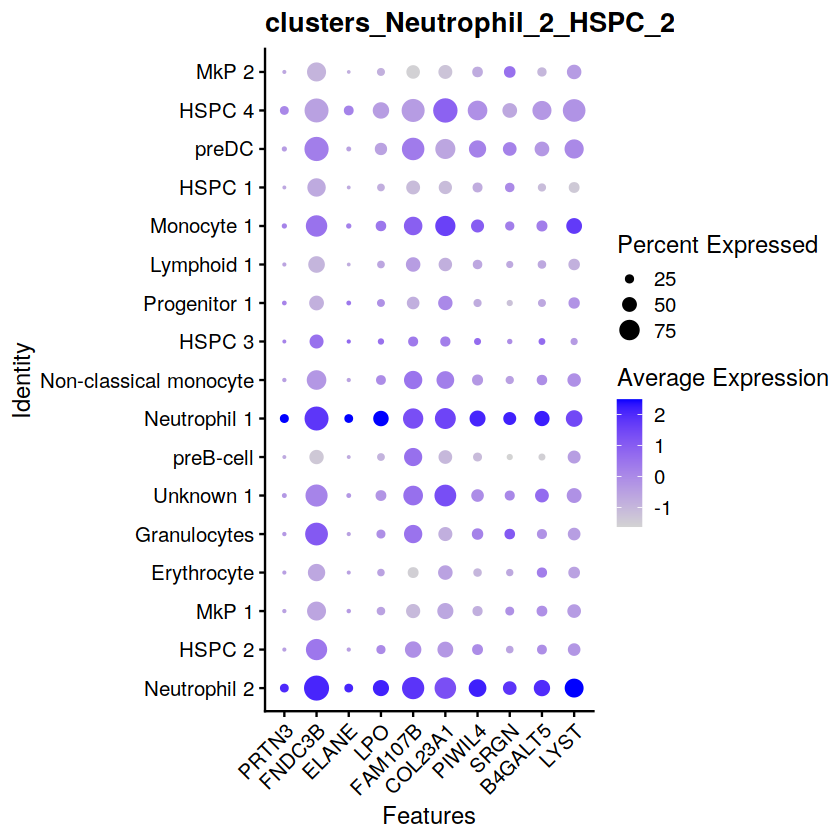

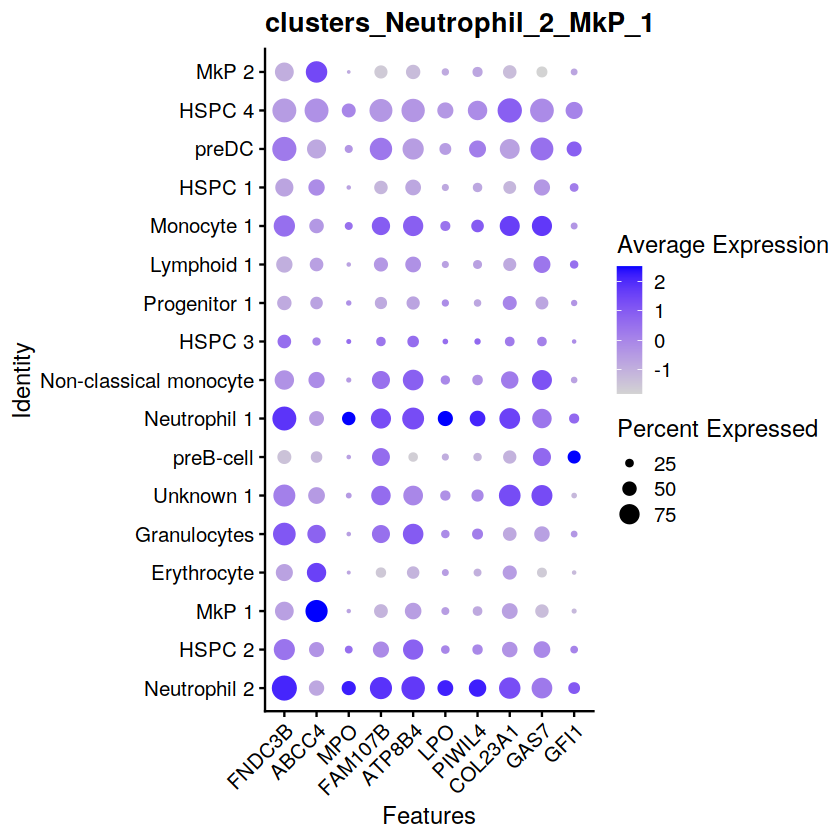

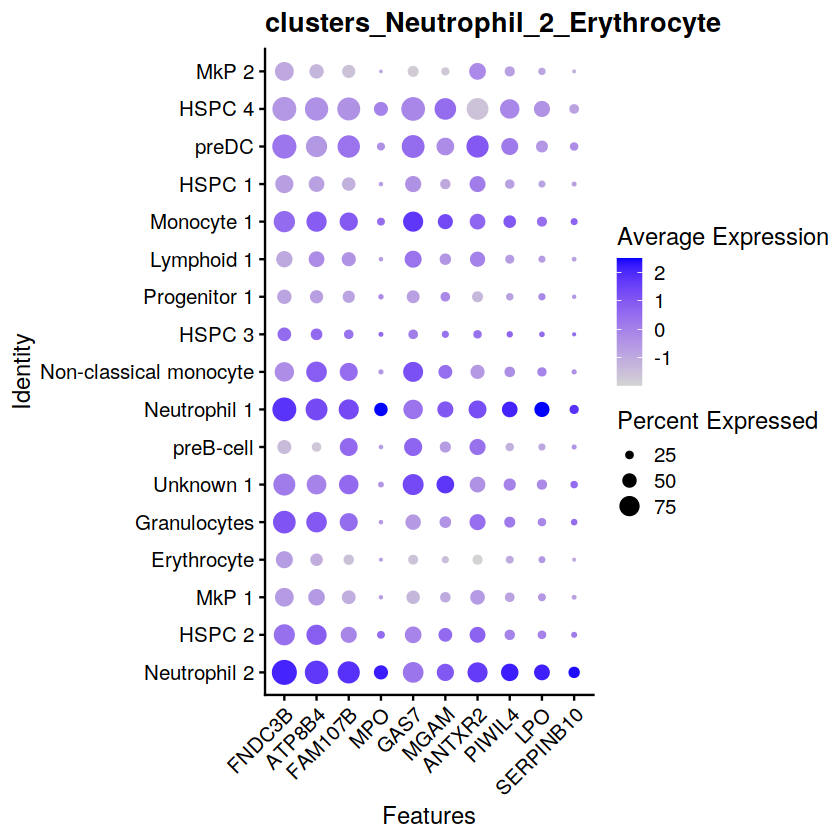

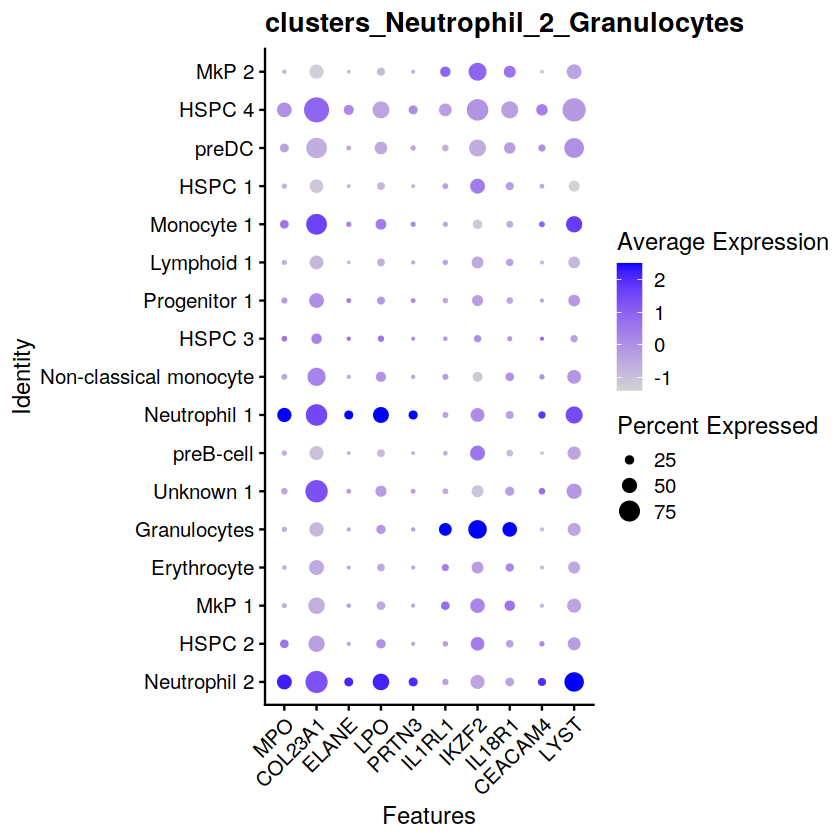

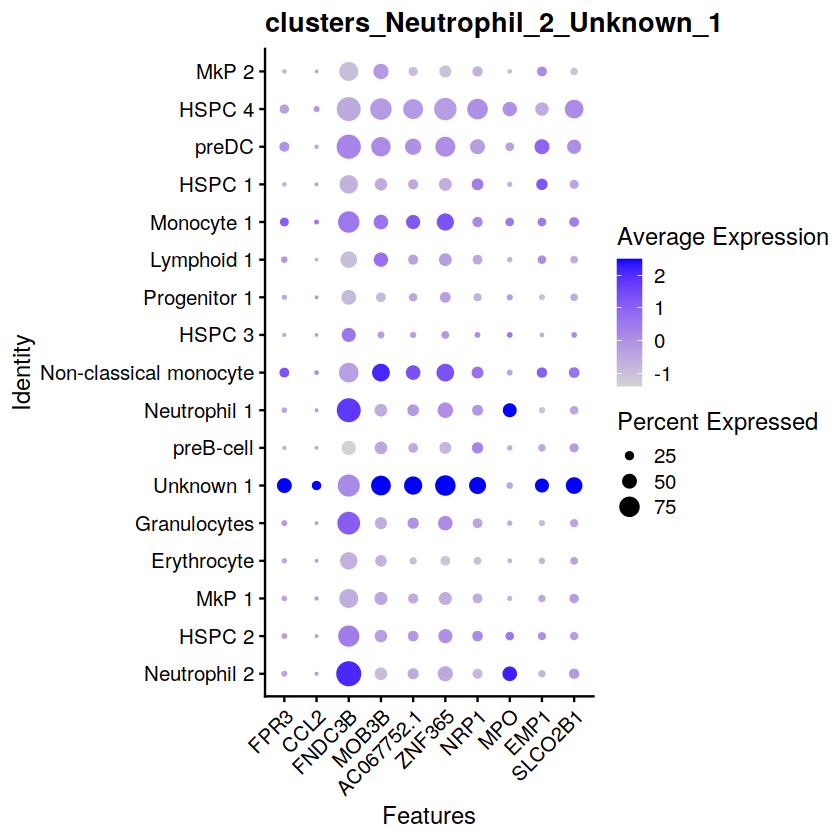

...

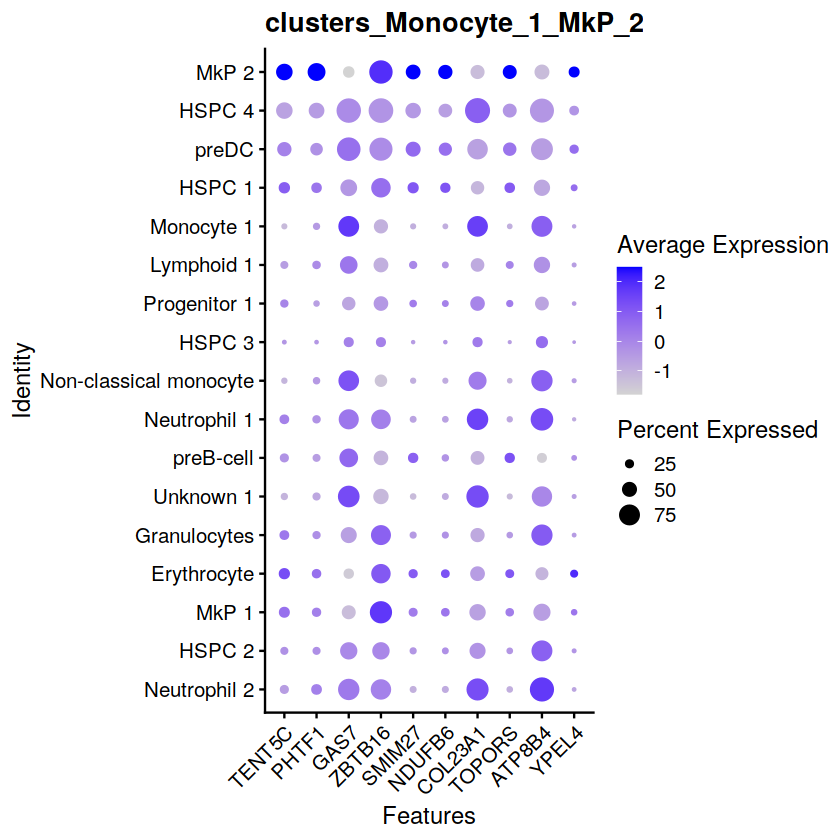

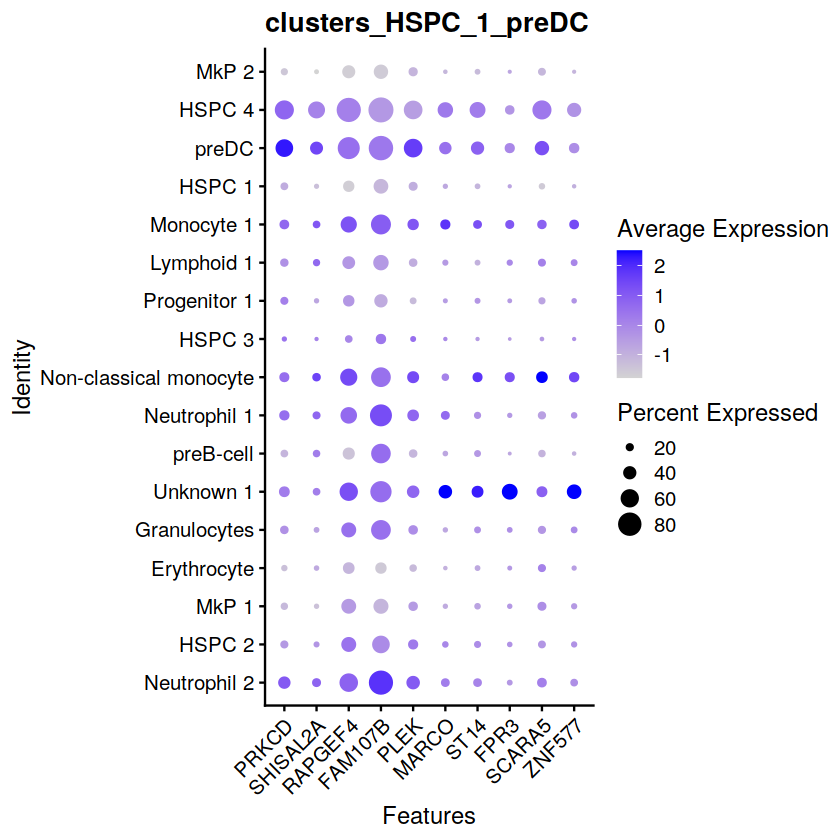

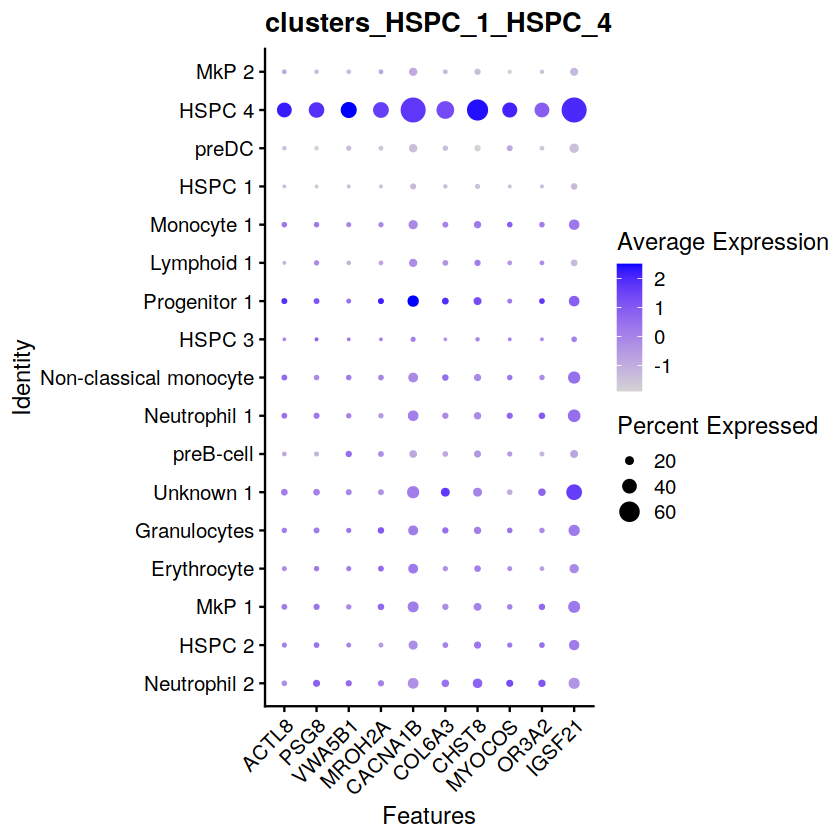

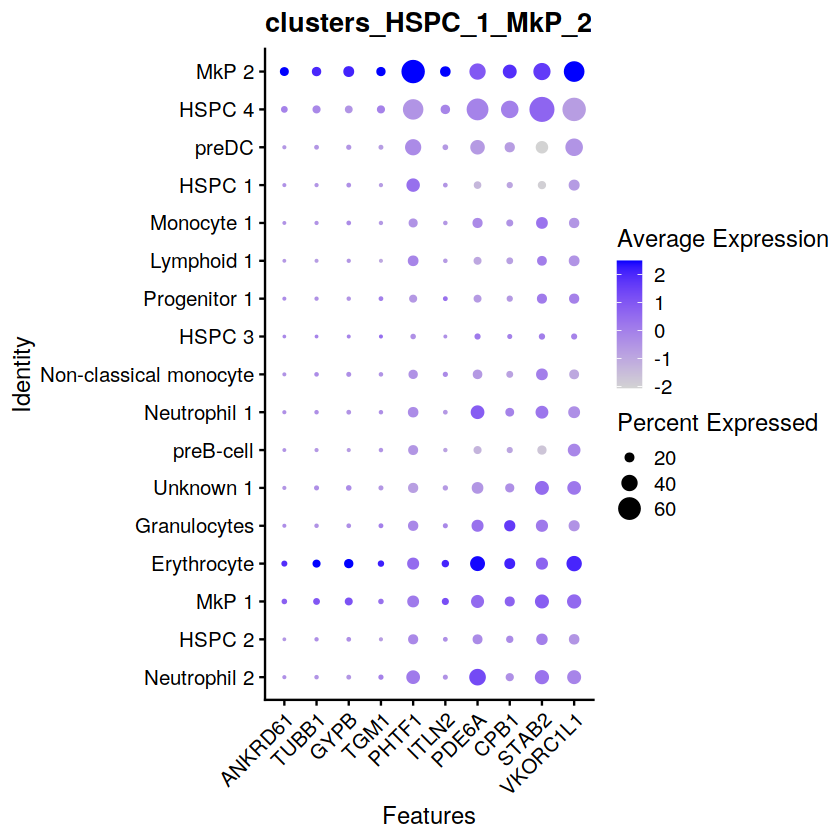

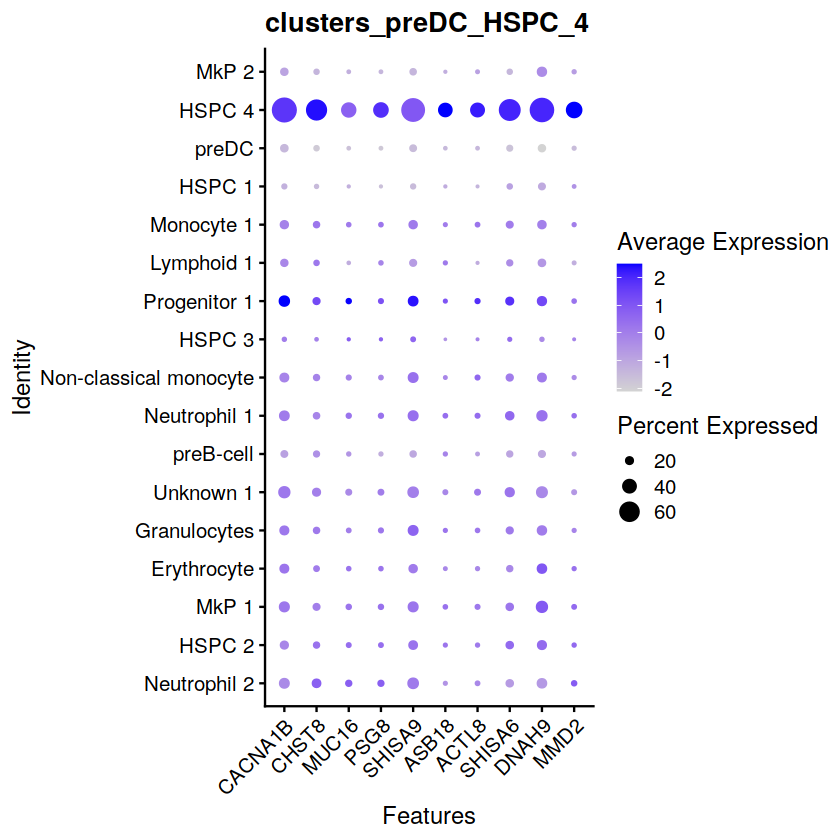

[[1]]

[[2]]

[[3]]

[[4]]

[[5]]

[[6]]

[[7]]

[[8]]

[[9]]

[[10]]

[[11]]

[[12]]

[[13]]

[[14]]

[[15]]

[[16]]

[[17]]

[[18]]

[[19]]

[[20]]

[[21]]

[[22]]

[[23]]

[[24]]

[[25]]

[[26]]

[[27]]

[[28]]

[[29]]

[[30]]

[[31]]

[[32]]

[[33]]

[[34]]

[[35]]

[[36]]

[[37]]

[[38]]

[[39]]

[[40]]

[[41]]

[[42]]

[[43]]

[[44]]

[[45]]

[[46]]

[[47]]

[[48]]

[[49]]

[[50]]

[[51]]

[[52]]

[[53]]

[[54]]

[[55]]

[[56]]

[[57]]

[[58]]

[[59]]

[[60]]

[[61]]

[[62]]

[[63]]

[[64]]

[[65]]

[[66]]

[[67]]

[[68]]

[[69]]

[[70]]

[[71]]

[[72]]

[[73]]

[[74]]

[[75]]

[[76]]

[[77]]

[[78]]

[[79]]

[[80]]

[[81]]

[[82]]

[[83]]

[[84]]

[[85]]

[[86]]

[[87]]

[[88]]

[[89]]

[[90]]

[[91]]

[[92]]

[[93]]

[[94]]

[[95]]

[[96]]

[[97]]

[[98]]

[[99]]

[[100]]

[[101]]

[[102]]

[[103]]

[[104]]

[[105]]

[[106]]

[[107]]

[[108]]

[[109]]

[[110]]

[[111]]

[[112]]

[[113]]

[[114]]

[[115]]

[[116]]

[[117]]

[[118]]

[[119]]

[[120]]

[[121]]

[[122]]

[[123]]

[

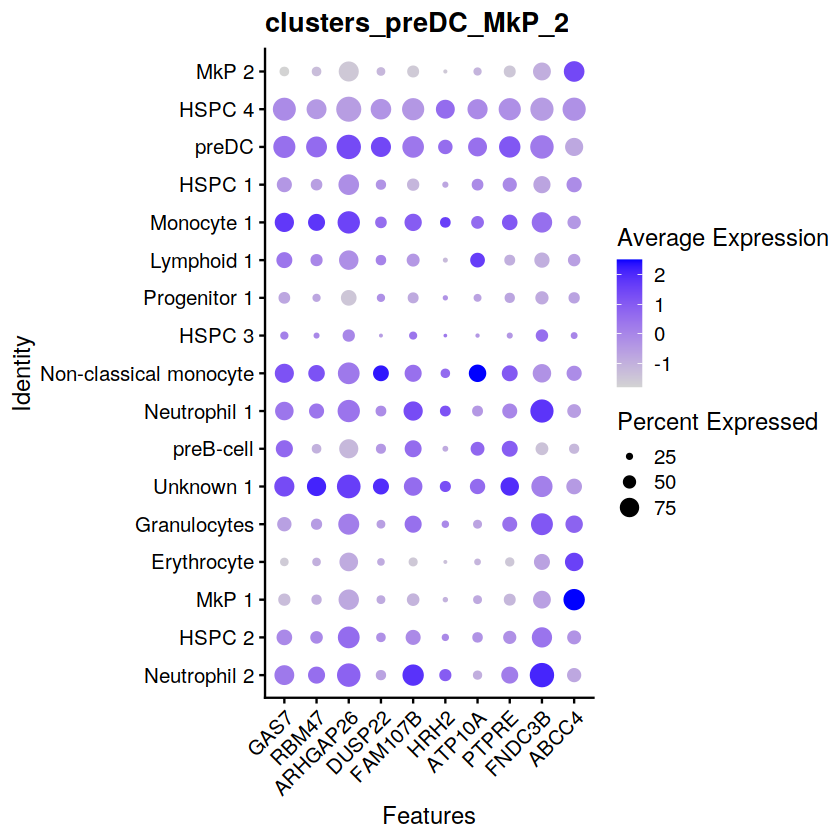

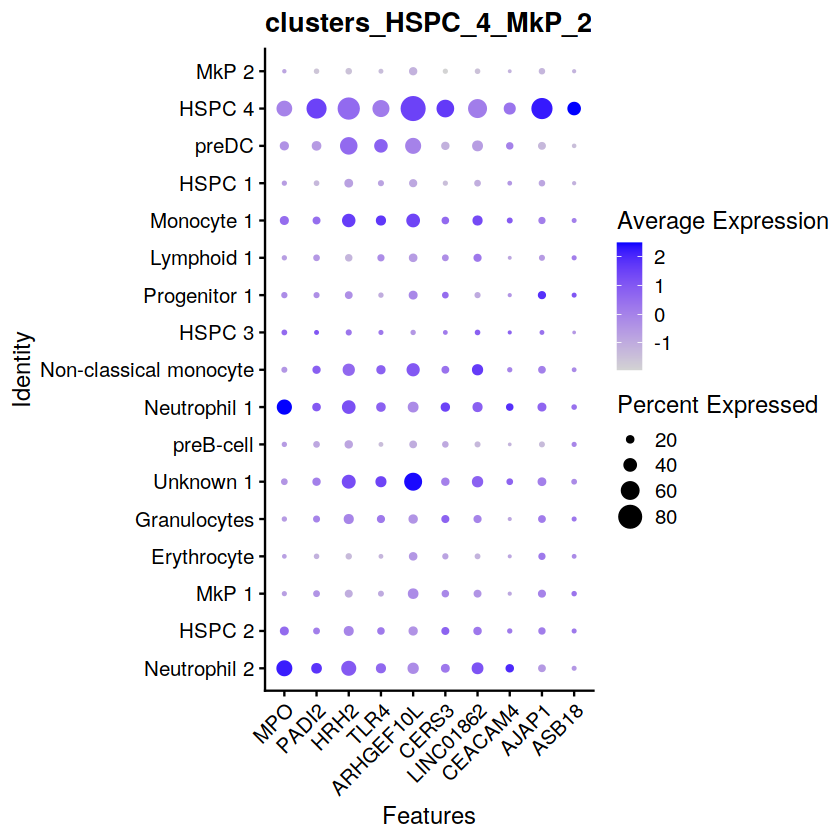

In [15]:
lapply(cl_pairs, pair_de)

In [10]:

# for (p in 1:length(cl_pairs)){
#     print("a")
#     print(cl_pairs[[p]][1])
#     print("b")
#     print(cl_pairs[[p]][2])

#     id1 = cl_pairs[[p]][1]
#     id2 = cl_pairs[[p]][2]
#     name <- paste0("clusters_", id1, "_", id2)
#     try({
#         print(paste("cluster", id1))
#         response <- FindMarkers(
#                       object = se,
#                       ident.1 = id1, ident.2=id2, #"CD4 Naive",
#                       min.pct = minPct, logfc.threshold=logfcthresh,
#                       test.use = 'wilcox', latent.vars = NULL
#                     )
#         print(head(response))

#         print(paste('saved cluster', id1))
#         response <- response %>% dplyr::arrange(p_val)
#         response$p_val_adj_BH <- stats::p.adjust(response$p_val, method = "BH", n = length(response$p_val))    
#         write.csv(response,
#                   file=file.path(outdir, paste0(name,".DE.csv")), quote=F)
#         curr.sig <- response %>% dplyr::filter(p_val_adj_BH<p_thresh)
#         names.sig <- rownames(curr.sig)

#         # Add to all pvals
#         all.names.sig <- c(all.names.sig, head(names.sig, top_de))
#         all.pvals[names.sig,id1] <- curr.sig$p_val_adj_BH
#         de.plots(se, names.sig, outdir, curr.name=name, max.size=10, to.heat=T,to.vln=T)

#     })
    
# }


[1] "a"
[1] "11"
[1] "b"
[1] "2"
[1] "clusters_11_2"
[1] "cluster 11"
Error in WhichCells.Seurat(object = object, idents = ident.1) : 
  Cannot find the following identities in the object: 11
[1] "a"
[1] "11"
[1] "b"
[1] "6"
[1] "clusters_11_6"
[1] "cluster 11"
Error in WhichCells.Seurat(object = object, idents = ident.1) : 
  Cannot find the following identities in the object: 11
[1] "a"
[1] "11"
[1] "b"
[1] "7"
[1] "clusters_11_7"
[1] "cluster 11"
Error in WhichCells.Seurat(object = object, idents = ident.1) : 
  Cannot find the following identities in the object: 11
[1] "a"
[1] "11"
[1] "b"
[1] "4"
[1] "clusters_11_4"
[1] "cluster 11"
Error in WhichCells.Seurat(object = object, idents = ident.1) : 
  Cannot find the following identities in the object: 11
[1] "a"
[1] "11"
[1] "b"
[1] "14"
[1] "clusters_11_14"
[1] "cluster 11"
Error in WhichCells.Seurat(object = object, idents = ident.1) : 
  Cannot find the following identities in the object: 11
[1] "a"
[1] "11"
[1] "b"
[1] "9"
[1] "

---

---

---

In [11]:
sessionInfo()

R version 4.1.1 (2021-08-10)
Platform: x86_64-conda-linux-gnu (64-bit)
Running under: Ubuntu 20.04.4 LTS

Matrix products: default
BLAS/LAPACK: /home/isaac/miniconda3/envs/mttrace/lib/libopenblasp-r0.3.20.so

locale:
 [1] LC_CTYPE=en_US.UTF-8       LC_NUMERIC=C              
 [3] LC_TIME=en_US.UTF-8        LC_COLLATE=en_US.UTF-8    
 [5] LC_MONETARY=en_US.UTF-8    LC_MESSAGES=en_US.UTF-8   
 [7] LC_PAPER=en_US.UTF-8       LC_NAME=C                 
 [9] LC_ADDRESS=C               LC_TELEPHONE=C            
[11] LC_MEASUREMENT=en_US.UTF-8 LC_IDENTIFICATION=C       

attached base packages:
[1] stats4    stats     graphics  grDevices utils     datasets  methods  
[8] base     

other attached packages:
 [1] future_1.25.0             RColorBrewer_1.1-3       
 [3] metap_1.1                 cowplot_1.1.1            
 [5] magrittr_2.0.3            data.table_1.14.2        
 [7] EnsDb.Hsapiens.v75_2.99.0 ensembldb_2.18.1         
 [9] AnnotationFilter_1.18.0   GenomicFeatures_1.46.1   
[11] 